<img src="capa.png" alt="Capa" width="1200"/>

# ANÁLISE DE GERENCIAMENTO DE INVENTÁRIO

-----
## INTRODUÇÃO

O gerenciamento eficiente de inventário é um dos pilares fundamentais para o sucesso de qualquer empresa que trabalha com produtos físicos. A capacidade de otimizar os níveis de estoque, prever demandas futuras e minimizar custos operacionais pode representar a diferença entre o lucro e o prejuízo.

### Contexto do Negócio

- **Problema:** Empresa possui muitos produtos em estoque, mas apenas ~10% vendem anualmente
- **Objetivo:** Usar machine learning para gerar scores de probabilidade de venda por produto
- **Decisão:** Determinar quais produtos manter e quais remover do inventário
- **Impacto:** Otimizar capital de giro e espaço de armazenamento

----
## OBJETIVOS

Este notebook tem como objetivo realizar uma **análise de dados de inventário** para extrair insights que possam orientar decisões estratégicas de negócio. Os principais objetivos incluem:

###  Objetivos Principais:
- **Análise Exploratória**: Compreender o comportamento dos dados de estoque, vendas e demanda
- **Identificação de Padrões**: Descobrir tendências sazonais e padrões de consumo
- **Otimização de Estoque**: Determinar níveis ótimos de estoque para minimizar custos
- **Previsão de Demanda**: Desenvolver modelos preditivos para antecipação de necessidades futuras
- **Análise de Performance**: Avaliar indicadores-chave de performance (KPIs) do inventário

### Importância do Projeto
- **Redução de Custos**: Otimização de capital de giro através do controle inteligente de estoque
- **Melhoria no Atendimento**: Redução de stockouts e melhoria na disponibilidade de produtos
- **Planejamento Estratégico**: Insights para tomada de decisões baseada em dados
- **Eficiência Operacional**: Identificação de gargalos e oportunidades de melhoria

-----
## DETALHES DO CONJUNTO DE DADOS

### Sobre o Dataset

Este dataset contém informações de produtos de uma empresa que precisa decidir quais itens manter ou remover do seu inventário. O conjunto combina **dados históricos de vendas** com **inventário ativo atual**, permitindo a criação de modelos preditivos para otimização de estoque.

#### Estrutura dos Dados

O dataset é dividido em dois tipos de registros:

#### Dados Históricos (`File_Type = "Historical"`)
- Vendas dos últimos 6 meses
- Contém a variável target (`SoldFlag`)
- Usado para treinar modelos preditivos

#### Dados Ativos (`File_Type = "Active"`)  
- Inventário atual da empresa
- Não possui informações de venda
- Receberá scores de probabilidade do modelo

### Descrição das Variáveis

#### Identificadores
* `Order`  Contador sequencial (pode ser ignorado)
* `SKU_number`  Código único de identificação do produto
* `File_Type` Tipo de registro: "Historical" ou "Active"

### Variável Target
* `SoldFlag` **TARGET PRINCIPAL** - 1 = produto vendeu nos últimos 6 meses, 0 = não vendeu
* `SoldCount` Quantidade total vendida nos últimos 6 meses

### Características do Produto
* `ReleaseYear`  Ano em que o produto foi lançado
* `ReleaseNumber`  Número da versão/edição do produto
* `New_Release_Flag`  1 = produto que teve lançamentos futuros (ReleaseNumber > 1), 0 = não
* `StrengthFactor`  Métrica interna da empresa (significado não especificado)

### Variáveis de Preço
* `PriceReg`  Preço regular do produto
* `LowUserPrice`  Preço promocional para usuários
* `LowNetPrice`  Preço líquido promocional

### Marketing e Operações
* `MarketingType`  Tipo de estratégia de marketing: "S" ou "D"
* `ItemCount`  Quantidade de itens/unidades por registro

---
## MODELO DE BASE VS MACHINE LEARNING

Antes de iniciarmos a análise devemos nos perguntar: não seria mais simples pegar o SKU dos produtos vendidos e identificar os produtos novos com base no SKU ao invés de utilizarmos machine learning?

### Vantagens da Abordagem Simples (Modelo de Base)

- *Velocidade*: Implementação em 5 linhas de código
- *Simplicidade*: 100% interpretável pelos gestores  
- *Confiabilidade*: "Se vendeu antes, pode vender de novo"
- *Sem Overfitting*: Não há risco de complicar desnecessariamente
- *Baseline Sólida*: Ótimo ponto de partida

### Desvantagens da Abordagem Simples

- *Produtos Novos*: E os SKUs que nunca venderam mas têm potencial?
- *Sazonalidade*: Produto que não vendeu nos últimos 6 meses mas vende no Natal?
- *Tendências*: Mudanças de mercado não são capturadas
- *Características*: Ignora preço, marketing, categoria, etc.
- *Oportunidades Perdidas*: Pode descartar produtos promissores


### Vantagens do Machine Learning

- *Descoberta de Padrões*: "Produtos com preço X e marketing Y têm 70% chance de vender"
- *Produtos Similares*: Identifica novos produtos com características de sucesso
- *Variáveis Múltiplas*: Considera preço, ano, marketing, etc.
- *Adaptabilidade*: Aprende com mudanças de tendências
- *Precisão Refinada*: Scores de probabilidade ao invés de sim/não binário

### Desvantagens do Machine Learning

- *Complexidade*: horas de desenvolvimento vs
- *Black Box*: Difícil explicar para gestores "por que manter produto X?"
- *Overfitting*: Pode "decorar" padrões que não se repetirão
- *Dados*: Precisa de dados limpos e representativos
- *Manutenção*: Precisa retreinamento periódico


### Quando Usar Abordagem simples quando?

* Se a variedade dos seus produtos é limitada e os padrões de venda se repetem consistentemente, você pode usar a abordagem de que o que vendeu bem no passado, venderá novamente no futuro; ou quando necessitamos de uma solução rápida e não temos tempo de rodar um modelo de machine learning.


### Quando Usar Machine Learning quando?

* Quando você lida com um portfólio dinâmico e com o lançamento constante de novos produtos, a complexidade aumenta. Nesse cenário, múltiplas variáveis como preço, ações de marketing e sazonalidade influenciam diretamente nas vendas.

* Em vez de depender de padrões históricos, um modelo preditivo pode encontrar conexões complexas, como a de que "produtos similares a X tendem a vender bem". Isso permite ir além da simples repetição, ajudando a otimizar constantemente as estratégias.


### Recomendação

* Para a maioria dos casos, comece com a abordagem simples como baseline e evolua para ML apenas se necessário!
---

## IMPORTAR BIBLIOTECAS NECESSÁRIAS

In [1]:
#@title Bloco de Código 1
# =============================================================================
# IMPORTAR BIBLIOTECAS NECESSÁRIAS
# =============================================================================

# Bibliotecas para manipulação e análise de dados
import pandas as pd
import numpy as np

# Bibliotecas utilitárias
import os
import sys
import warnings
warnings.filterwarnings('ignore')
from pathlib import Path

# Bibliotecas para visualização de dados
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import matplotlib as mpl
from matplotlib.patches import Ellipse
import seaborn as sns
from textwrap import fill
import plotly.express as px

# Bibliotecas para análise estatística
from scipy import stats
from scipy.stats import pearsonr, spearmanr
import statsmodels.api as sm
from scipy.stats import gaussian_kde
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, PowerTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import (
    roc_auc_score, recall_score, precision_score,
    accuracy_score, f1_score, confusion_matrix,
    silhouette_score, silhouette_samples,
    davies_bouldin_score, calinski_harabasz_score
)

# Importar bibliotecas machine learning
#%pip uninstall pycaret -y
#%pip install -U pycaret==3.3.2 imbalanced-learn
from pycaret.classification import setup, compare_models, pull, load_model, predict_model, finalize_model, evaluate_model, save_model, stack_models, finalize_model, blend_models, tune_model
import pycaret
print(pycaret.__version__)

# Pasta para salvar modelos
SAVE_DIR = Path(r"D:/OneDrive/Documentos/GitHub/portifolio/gestao_estoques/models")


3.3.2


----

## IMPORTAR DADOS

In [3]:
# =============================================================================
# IMPORTAR DADOS
# =============================================================================
# Leitura dos dados
df = pd.read_csv("data/SalesKaggle3.csv")

# Exibe as 5 primeiras linhas
print("Primeiras linhas:")
display(df.head())

# Tipos de dados
print("\n Tipos de colunas:")
print(df.dtypes)


Primeiras linhas:


,Order,File_Type,SKU_number,SoldFlag,SoldCount,MarketingType,ReleaseNumber,New_Release_Flag,StrengthFactor,PriceReg,ReleaseYear,ItemCount,LowUserPrice,LowNetPrice
0,2,Historical,1737127,0.0,0.0,D,15,1,682743.0,44.99,2015,8,28.97,31.84
1,3,Historical,3255963,0.0,0.0,D,7,1,1016014.0,24.81,2005,39,0.00,15.54
2,4,Historical,612701,0.0,0.0,D,0,0,340464.0,46.00,2013,34,30.19,27.97
3,6,Historical,115883,1.0,1.0,D,4,1,334011.0,100.00,2006,20,133.93,83.15
4,7,Historical,863939,1.0,1.0,D,2,1,1287938.0,121.95,2010,28,4.00,23.99



 Tipos de colunas:
Order                 int64
File_Type            object
SKU_number            int64
SoldFlag            float64
SoldCount           float64
MarketingType        object
ReleaseNumber         int64
New_Release_Flag      int64
StrengthFactor      float64
PriceReg            float64
ReleaseYear           int64
ItemCount             int64
LowUserPrice        float64
LowNetPrice         float64
dtype: object


----

## VISÃO GERAL DO DATASET

In [3]:
# =============================================================================
# VISÃO GERAL DO DATASET
# =============================================================================

# visão geral do df
print(" VISÃO GERAL DO DATASET")
print("="*50)

# Dimensões do dataset
print(f" Dimensões: {df.shape[0]:,} linhas x {df.shape[1]} colunas")

# Valores únicos por coluna
print("\n Valores únicos por coluna:")
for col, unique_count in df.nunique().items():
    print(f"   {col}: {unique_count:,}")

# Análise específica para File_Type (se existir)
if 'File_Type' in df.columns:
    print(f"\n Distribuição por File_Type:")
    counts = df['File_Type'].value_counts()
    for file_type, count in counts.items():
        print(f"   {file_type}: {count:,} registros ({count/len(df)*100:.1f}%)")

# Separar dados históricos e ativos (se aplicável)
if 'File_Type' in df.columns:
    hist_data = df[df['File_Type'] == 'Historical']
    active_data = df[df['File_Type'] == 'Active']
    print(f"\n Dados separados: {len(hist_data):,} históricos + {len(active_data):,} ativos")


 VISÃO GERAL DO DATASET
 Dimensões: 198,917 linhas x 14 colunas

 Valores únicos por coluna:
   Order: 198,917
   File_Type: 2
   SKU_number: 133,360
   SoldFlag: 2
   SoldCount: 37
   MarketingType: 2
   ReleaseNumber: 71
   New_Release_Flag: 2
   StrengthFactor: 197,424
   PriceReg: 11,627
   ReleaseYear: 85
   ItemCount: 501
   LowUserPrice: 12,102
   LowNetPrice: 15,403

 Distribuição por File_Type:
   Active: 122,921 registros (61.8%)
   Historical: 75,996 registros (38.2%)

 Dados separados: 75,996 históricos + 122,921 ativos


## Interpretação dos Resultados

### 1. Dimensões do Dataset

| Característica | Valor |
| :--- | :--- |
| Registros (linhas) | 198.917 |
| Variáveis (colunas) | 14 |

### 2. Valores Únicos por Coluna

| Variável | Valores Únicos | Descrição |
| :--- | :--- | :--- |
| **Order** | 198.917 | Cada pedido é único (chave primária). |
| **File_Type** | 2 | Apenas dois tipos de arquivos: Histórico e Ativo. |
| **SKU_number** | 133.360 | O número de produtos únicos. |
| **SoldFlag** | 2 | Flag binária que indica se o produto foi vendido (sim/não). |
| **SoldCount** | 37 | O número de diferentes quantidades vendidas. |
| **MarketingType** | 2 | Dois tipos distintos de estratégia de marketing. |
| **ReleaseNumber** | 71 | O número de diferentes lançamentos. |
| **New_Release_Flag** | 2 | Flag binária que indica se o produto é um novo lançamento (sim/não). |
| **StrengthFactor** | 197.424 | Quase todos os valores são únicos. |
| **PriceReg** | 11.627 | O número de diferentes preços regulares. |
| **ReleaseYear** | 85 | O número de diferentes anos de lançamento. |
| **ItemCount** | 501 | O número de diferentes contagens de itens. |
| **LowUserPrice** | 12.102 | O número de diferentes preços baixos para o usuário. |
| **LowNetPrice** | 15.403 | O número de diferentes preços líquidos baixos. |


### 3. Distribuição por Tipo de Arquivo

| Tipo de Arquivo | Registros | Porcentagem |
| :--- | :--- | :--- |
| **Histórico** | 75.996 | 38.2% |
| **Ativo** | 122.921 | 61.8% |

### Características do Dataset:
- Dataset balanceado: com mais dados ativos que históricos
- Alta granularidade: de produtos (133k SKUs únicos)
- Variáveis categóricas simples: (flags binários)
- Variáveis numéricas diversificadas: (preços, contadores, fatores)

### Observações Importantes:
- *Order*: tem valores únicos = cada linha é um pedido único
- *StrengthFactor*: tem quase todos valores únicos (197k de 198k)
- Muita variação em preços (*PriceReg*, *LowUserPrice*, *LowNetPrice*)
- Dados cobrem 85 anos diferentes (*ReleaseYear*)


----

## ESTATÍSTICAS DESCRITIVAS

In [4]:
# =============================================================================
# ESTATÍSTICAS DESCRITIVAS
# =============================================================================

# Incluir variáveis categóricas
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Order,198917.0,NaN,NaN,NaN,106483.543242,60136.716784,2.0,55665.0,108569.0,158298.0,208027.0
File_Type,198917,2,Active,122921,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SKU_number,198917.0,NaN,NaN,NaN,861362.626422,869979.38013,50001.0,217252.0,612208.0,904751.0,3960788.0
SoldFlag,75996.0,NaN,NaN,NaN,0.171009,0.376519,0.0,0.0,0.0,0.0,1.0
SoldCount,75996.0,NaN,NaN,NaN,0.322306,1.168615,0.0,0.0,0.0,0.0,73.0
MarketingType,198917,2,S,100946,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ReleaseNumber,198917.0,NaN,NaN,NaN,3.412202,3.864243,0.0,1.0,2.0,5.0,99.0
New_Release_Flag,198917.0,NaN,NaN,NaN,0.642248,0.47934,0.0,0.0,1.0,1.0,1.0
StrengthFactor,198917.0,NaN,NaN,NaN,1117115.214521,1522090.38546,6.275,161418.7675,582224.0,1430083.0,17384454.0
PriceReg,198917.0,NaN,NaN,NaN,90.895243,86.736367,0.0,42.0,69.95,116.0,12671.48


## Análise das Estatísticas Descritivas

### Observações Principais:

> Variáveis com Dados Incompletos:
- ***SoldFlag*** e ***SoldCount***: apenas 75,996 registros (38%) - corresponde exatamente aos dados históricos
- Confirma que vendas só existem no dataset histórico

>Variáveis Categóricas:
- ***File_Type***: 2 categorias (Active mais frequente)
- ***MarketingType***: 2 categorias (S mais frequente com 100,946 registros)

>Identificadores:
- ***Order***: 198,917 valores únicos (chave primária)
- ***SKU_number***: 133,360 produtos únicos

>Flags Binários:
- ***New_Release_Flag***: 64% são novos lançamentos (média 0.64)
- ***SoldFlag***: 17% dos itens históricos foram vendidos

>Métricas de Negócio:
- ***ReleaseYear***: Dados de 2003 a 2018 (15 anos)
- ***PriceReg***: Preços de 0,00 a 12,671 (média R$ 90,90)
- ***ItemCount***: 1 a 2,542 itens por pedido (média 41)
- ***SoldCount***: Máximo 73 unidades vendidas

>Alerta:
- ***StrengthFactor***: Valores extremamente altos (até 17+ milhões) - possível erro ou métrica calculada

----

## PLOTAR COLUNAS CATEGÓRICAS

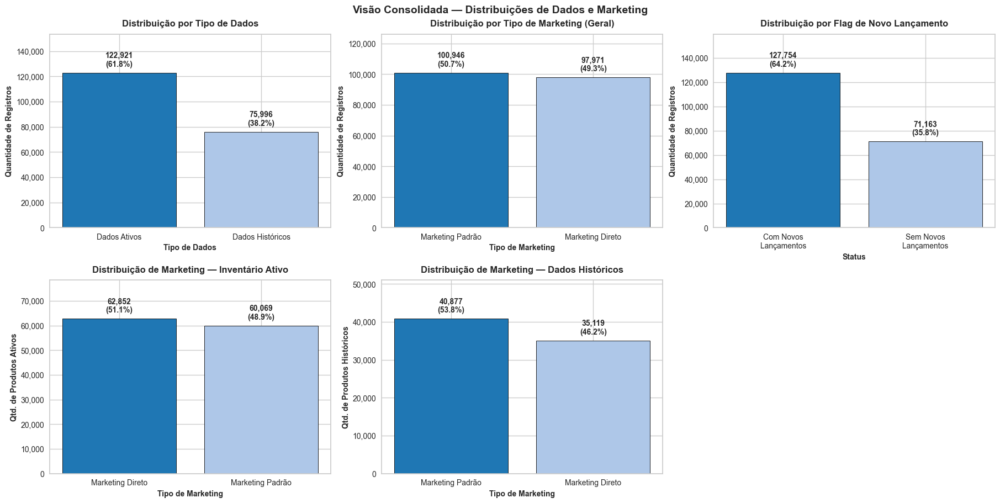

In [5]:
#=======================================================================
# PLOTAR COLUNAS CATEGÓRICAS
#=======================================================================

# ---------- Mapeamentos ----------
file_type_mapping = {
    'Historical': 'Dados Históricos',
    'Active': 'Dados Ativos'
}
marketing_mapping_global = {
    'S': 'Marketing Padrão',
    'D': 'Marketing Direto'
}
release_mapping = {
    0: 'Sem Novos Lançamentos',
    1: 'Com Novos Lançamentos'
}

# ---------- Funções auxiliares ----------
def make_palette(categories, cmap_name='tab20'):
    """Gera uma lista de cores distintas do colormap para o nº de categorias."""
    import seaborn as sns
    return sns.color_palette(cmap_name, n_colors=len(categories))

def wrap_labels(labels, width=14):
    """Quebra rótulos longos em múltiplas linhas para não sobrepor."""
    return [fill(str(l), width=width) for l in labels]

def barplot_counts(ax, series, title, xlabel, ylabel):
    """
    Desenha barplot com:
      - cores únicas por categoria
      - rótulos (contagem + %) sem sobreposição
      - y-format com milhares
    """
    # Ordena por valor desc para estética (opcional)
    series = series.sort_values(ascending=False)

    cats = series.index.astype(str).tolist()
    vals = series.values.astype(float)
    total = vals.sum()

    # Paleta distinta por categoria
    colors = make_palette(cats)

    # Desenha barras
    bars = ax.bar(cats, vals, color=colors, edgecolor='black', linewidth=0.6)

    # Eixo Y com folga para rótulos
    ymax = vals.max() if len(vals) else 0
    ax.set_ylim(0, ymax * 1.25 + (1 if ymax == 0 else 0))

    # Formatação do eixo Y
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, p: f'{x:,.0f}'))

    # Rótulos nas barras (contagem e %), com offset fixo para não colidir
    for bar, v in zip(bars, vals):
        pct = (v / total * 100) if total > 0 else 0.0
        y = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2.,
            y + max(ymax * 0.03, 0.5),              # offset baseado no topo (não no valor da barra)
            f'{int(v):,}\n({pct:.1f}%)',
            ha='center', va='bottom', fontsize=10, fontweight='bold', clip_on=False
        )

    # Títulos e eixos
    ax.set_title(title, fontsize=12, fontweight='bold', pad=10)
    ax.set_xlabel(xlabel, fontsize=10, fontweight='bold')
    ax.set_ylabel(ylabel, fontsize=10, fontweight='bold')

    # Rótulos do eixo X com quebra de linha e leve rotação
    ax.set_xticklabels(wrap_labels(cats, width=16), rotation=0, ha='center')
    ax.tick_params(axis='both', labelsize=10)

# ---------- Preparação dos dados ----------
d1 = df.copy()

# a) Tipo de arquivo
d1['File_Type_Clean'] = d1['File_Type'].map(file_type_mapping).fillna(d1['File_Type'])
ft_counts = d1['File_Type_Clean'].value_counts()

# b) Marketing geral
d1['MarketingType_Clean'] = d1['MarketingType'].map(marketing_mapping_global).fillna(d1['MarketingType'])
mk_counts_all = d1['MarketingType_Clean'].value_counts()

# c) New_Release_Flag
d1['New_Release_Flag_Clean'] = d1['New_Release_Flag'].map(release_mapping).fillna(d1['New_Release_Flag'])
rel_counts = d1['New_Release_Flag_Clean'].value_counts()

# d) Somente Ativos
d_active = d1[d1['File_Type'] == 'Active'].copy()
d_active['MarketingType_Clean'] = d_active['MarketingType'].map(marketing_mapping_global).fillna(d_active['MarketingType'])
mk_counts_active = d_active['MarketingType_Clean'].value_counts()

# e) Somente Históricos
d_hist = d1[d1['File_Type'] == 'Historical'].copy()
d_hist['MarketingType_Clean'] = d_hist['MarketingType'].map(marketing_mapping_global).fillna(d_hist['MarketingType'])
mk_counts_hist = d_hist['MarketingType_Clean'].value_counts()

# ---------- Figure única com subplots ----------
fig, axes = plt.subplots(2, 3, figsize=(18, 9), constrained_layout=True)
axes = axes.ravel()

barplot_counts(
    ax=axes[0],
    series=ft_counts,
    title='Distribuição por Tipo de Dados',
    xlabel='Tipo de Dados',
    ylabel='Quantidade de Registros'
)

barplot_counts(
    ax=axes[1],
    series=mk_counts_all,
    title='Distribuição por Tipo de Marketing (Geral)',
    xlabel='Tipo de Marketing',
    ylabel='Quantidade de Registros'
)

barplot_counts(
    ax=axes[2],
    series=rel_counts,
    title='Distribuição por Flag de Novo Lançamento',
    xlabel='Status',
    ylabel='Quantidade de Registros'
)

barplot_counts(
    ax=axes[3],
    series=mk_counts_active,
    title='Distribuição de Marketing — Inventário Ativo',
    xlabel='Tipo de Marketing',
    ylabel='Qtd. de Produtos Ativos'
)

barplot_counts(
    ax=axes[4],
    series=mk_counts_hist,
    title='Distribuição de Marketing — Dados Históricos',
    xlabel='Tipo de Marketing',
    ylabel='Qtd. de Produtos Históricos'
)

axes[5].axis('off')  # painel sobrando

fig.suptitle('Visão Consolidada — Distribuições de Dados e Marketing', fontsize=14, fontweight='bold')
plt.show()


## Análise dos Resultados

> **Resultados distribuição por tipo de dados**
- **Dataset desbalanceado**: 61.8% dados ativos vs 38.2% dados históricos
- **Volume significativo**: Quase 200k registros totais (198,917)
- **Predominância ativa**: Dados ativos representam quase 2/3 do dataset

> Implicações:
- **Para modelagem**: Usar dados históricos (75,996 registros) para treino
- **Balanceamento**: Considerar se o desbalanceamento afeta as análises futuras

> **Resultados distribuição por tipo de Marketing**
- **Distribuição quase balanceada**: Marketing Padrão (50.7%) vs Marketing D (49.3%)
- **Diferença mínima**: Apenas 2,975 registros de diferença entre os tipos
- **Volume significativo**: Ambos os tipos têm ~100k produtos cada

> Insights:
- **Estratégias equilibradas**: Empresa usa ambas estratégias de marketing de forma balanceada
- **Sem dominância clara**: Nenhum tipo de marketing representa mais que 51% dos produtos
- **Base sólida para análise**: Volumes similares permitem comparações estatísticas válidas

> R**esultados distribuição por tipos de produtos**
- **Maioria tem novos lançamentos**: 64.2% dos produtos tiveram versões futuras
- **Desbalanceamento moderado**: 2:1 a favor de produtos com novos lançamentos
- **Volume significativo**: Mais de 127k produtos com múltiplas versões

> Insights:
- **Estratégia de produto ativa**: Empresa investe em evolução/atualização de produtos existentes
- **Produtos longevos**: 64% dos itens no catálogo são "famílias de produtos" com múltiplas versões
- **Possível indicador de sucesso**: Produtos que geram novas versões podem ter melhor performance


> Resultados distribuição por tipos de Marketing (Direto ou Padrão)
- **Leve inversão**: Marketing Direto (51.1%) vs Marketing Padrão (48.9%)
- **Distribuição ainda balanceada**: Diferença de apenas 2.2% entre os tipos
- **Volume expressivo**: 122,921 produtos ativos para scoring

### Comparação com Dataset Geral:
| Tipo | Dataset Geral | Inventário Ativo | Diferença |
|------|---------------|------------------|-----------|
| Marketing Padrão | 50.7% | 48.9% | -1.8% |
| Marketing Direto | 49.3% | 51.1% | +1.8% |

> Insights:
- **Estratégia levemente diferente**: Inventário ativo tem mais produtos com marketing direto
- **Possível foco premium**: Marketing direto pode estar mais presente em produtos aguardando avaliação
- **Manutenção do equilíbrio**: Diferença mínima mantém estratégia balanceada

### Comparação Completa:

| Segmento | Marketing Padrão | Marketing Direto | Diferença |
|----------|------------------|------------------|-----------|
| **Dataset Geral** | 50.7% | 49.3% | +1.4% |
| **Dados Históricos** | 53.8% | 46.2% | +7.6% |
| **Inventário Ativo** | 48.9% | 51.1% | -2.2% |

#### Principais Resultados:

> **Inversão Clara:**
- **Dados Históricos**: Marketing Padrão domina (53.8%)
- **Inventário Ativo**: Marketing Direto domina (51.1%)
- **Diferença total**: 9.8 pontos percentuais entre extremos

#### Possíveis Interpretações:

> **Hipótese 1 - Performance de Vendas:**
- Marketing Padrão pode ter **maior rotatividade** (mais presente no histórico)
- Marketing Direto pode ter **menor rotatividade** (acumula no inventário)

> **Hipótese 2 - Estratégia Temporal:**
- Marketing Padrão pode ser estratégia **mais antiga** (concentrada no passado)
- Marketing Direto pode ser estratégia **mais recente** (concentrada no inventário atual)

> **Hipótese 3 - Ciclo de Produto:**
- Produtos com Marketing Padrão **vendem mais rápido**
- Produtos com Marketing Direto **permanecem mais tempo** no estoque


----

## **PLOTE COLUNAS NUMÉRICAS**

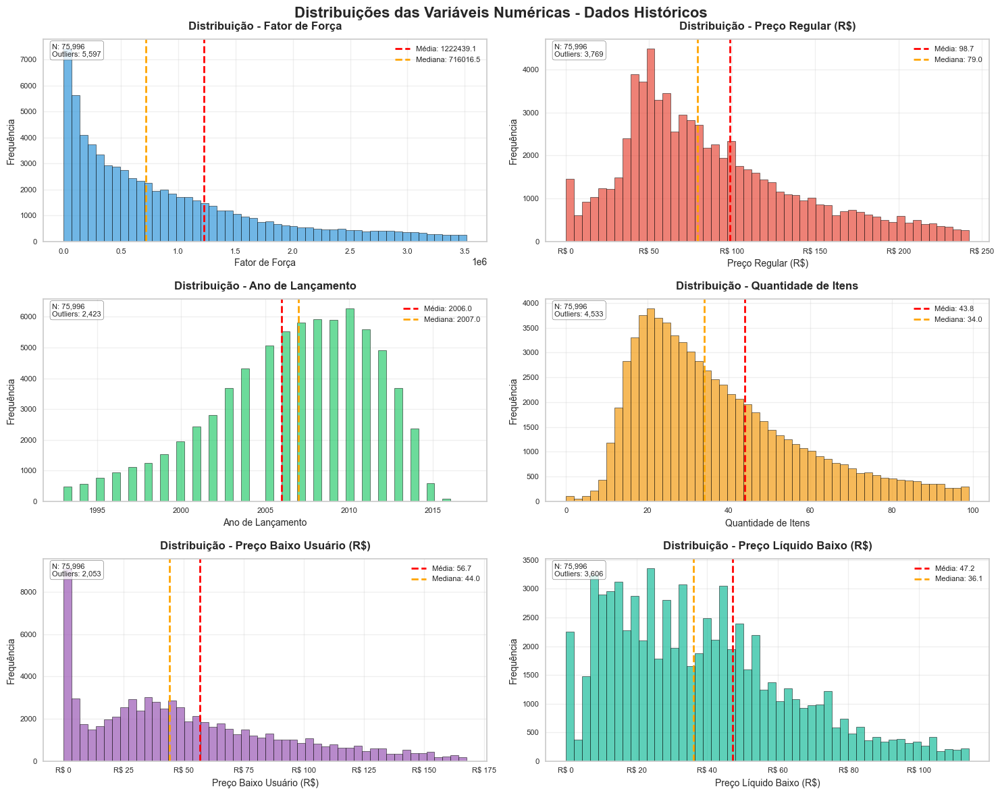

ESTATÍSTICAS DAS VARIÁVEIS NUMÉRICAS - DADOS HISTÓRICOS
Total de registros históricos: 75,996

Fator de Força:
  Média: 1222439.14
  Mediana: 716016.50
  Desvio Padrão: 1540520.75
  Min: 68.00 | Max: 16669658.00
  Outliers: 5,597 (7.4%)

Preço Regular (R$):
  Média: 98.73
  Mediana: 78.95
  Desvio Padrão: 78.71
  Min: 0.00 | Max: 3986.31
  Outliers: 3,769 (5.0%)

Ano de Lançamento:
  Média: 2005.97
  Mediana: 2007.00
  Desvio Padrão: 6.11
  Min: 1935.00 | Max: 2017.00
  Outliers: 2,423 (3.2%)

Quantidade de Itens:
  Média: 43.84
  Mediana: 34.00
  Desvio Padrão: 37.36
  Min: 0.00 | Max: 1523.00
  Outliers: 4,533 (6.0%)

Preço Baixo Usuário (R$):
  Média: 56.71
  Mediana: 44.03
  Desvio Padrão: 104.76
  Min: 0.00 | Max: 14140.21
  Outliers: 2,053 (2.7%)

Preço Líquido Baixo (R$):
  Média: 47.19
  Mediana: 36.13
  Desvio Padrão: 129.81
  Min: 0.00 | Max: 19138.79
  Outliers: 3,606 (4.7%)



In [6]:
# =============================================================================
# DISTRIBUIÇÕES DAS VARIÁVEIS NUMÉRICAS - DADOS HISTÓRICOS
# =============================================================================

# Filtrar dados históricos
df_hist = df[df['File_Type'] == 'Historical']

# Definir variáveis numéricas para análise
numerical_vars = ['StrengthFactor', 'PriceReg', 'ReleaseYear', 'ItemCount', 'LowUserPrice', 'LowNetPrice']

# Nomes mais descritivos para títulos
var_titles = {
    'StrengthFactor': 'Fator de Força',
    'PriceReg': 'Preço Regular (R$)',
    'ReleaseYear': 'Ano de Lançamento',
    'ItemCount': 'Quantidade de Itens',
    'LowUserPrice': 'Preço Baixo Usuário (R$)',
    'LowNetPrice': 'Preço Líquido Baixo (R$)'
}

# Criar figura com subplots
fig, axes = plt.subplots(3, 2, figsize=(15, 12), facecolor='white')
fig.suptitle('Distribuições das Variáveis Numéricas - Dados Históricos', fontsize=16, fontweight='bold', y=0.98)

# Achatar array de axes para facilitar iteração
axes = axes.flatten()

# Cores para cada gráfico
colors = ['#3498DB', '#E74C3C', '#2ECC71', '#F39C12', '#9B59B6', '#1ABC9C']

# Criar cada gráfico
for i, var in enumerate(numerical_vars):
    # Remover outliers extremos para melhor visualização (apenas para o plot)
    data = df_hist[var].copy()
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Dados para visualização (sem outliers extremos)
    data_filtered = data[(data >= lower_bound) & (data <= upper_bound)]

    # Criar histograma
    axes[i].hist(data_filtered, bins=50, alpha=0.7, color=colors[i], edgecolor='black', linewidth=0.5)

    # Adicionar linha da média
    mean_val = data.mean()
    axes[i].axvline(mean_val, color='red', linestyle='--', linewidth=2, label=f'Média: {mean_val:.1f}')

    # Adicionar linha da mediana
    median_val = data.median()
    axes[i].axvline(median_val, color='orange', linestyle='--', linewidth=2, label=f'Mediana: {median_val:.1f}')

    # Configurar título e labels
    axes[i].set_title(f'Distribuição - {var_titles[var]}', fontsize=12, fontweight='bold', pad=10)
    axes[i].set_xlabel(var_titles[var], fontsize=10)
    axes[i].set_ylabel('Frequência', fontsize=10)

    # Adicionar legenda
    axes[i].legend(fontsize=8, loc='upper right')

    # Formatar eixos
    axes[i].tick_params(axis='both', which='major', labelsize=8)

    # Formatação especial para variáveis monetárias
    if 'Price' in var:
        axes[i].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'R$ {x:,.0f}'))

    # Adicionar grid sutil
    axes[i].grid(True, alpha=0.3)

    # Estatísticas no canto
    stats_text = f'N: {len(data):,}\nOutliers: {len(data) - len(data_filtered):,}'
    axes[i].text(0.02, 0.98, stats_text, transform=axes[i].transAxes,
                fontsize=8, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Ajustar layout
plt.tight_layout()
plt.subplots_adjust(top=0.94)
plt.show()

# Estatísticas resumo
print("ESTATÍSTICAS DAS VARIÁVEIS NUMÉRICAS - DADOS HISTÓRICOS")
print("="*65)
print(f"Total de registros históricos: {len(df_hist):,}")
print()

for var in numerical_vars:
    data = df_hist[var]
    print(f"{var_titles[var]}:")
    print(f"  Média: {data.mean():.2f}")
    print(f"  Mediana: {data.median():.2f}")
    print(f"  Desvio Padrão: {data.std():.2f}")
    print(f"  Min: {data.min():.2f} | Max: {data.max():.2f}")

    # Identificar outliers
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    outliers = data[(data < Q1 - 1.5 * IQR) | (data > Q3 + 1.5 * IQR)]
    print(f"  Outliers: {len(outliers):,} ({len(outliers)/len(data)*100:.1f}%)")
    print()

## Análise - Distribuições das Variáveis Numéricas (Dados Históricos)

### Padrões Gerais Observados:

**Distribuições Assimétricas:** Todas as variáveis apresentam forte assimetria à direita, típico de dados de negócio.

### Análise por Variável:

**1. Fator de Força**
- **Distribuição:** Extremamente assimétrica, valores de 68 a 16+ milhões
- **Outliers:** 7.4% (5,597 produtos) - maior percentual
- **Interpretação:** Métrica com alta variabilidade, possivelmente calculada
- **Modelagem:** Necessária transformação logarítmica

**2. Preços (Regular, Baixo Usuário, Líquido Baixo)**
- **Padrão comum:** Concentração em valores baixos, cauda longa à direita
- **Preço Regular:** Mediana $ 79 dólares, produtos até 3.986 dólares
- **Produtos gratuitos:** Existem (min = 0)
- **Modelagem:** Considerar transformação log ou categorização

**3. Ano de Lançamento**
- **Distribuição:** Mais próxima da normal, centrada em 2007
- **Período:** Concentração 2000-2015, poucos produtos muito antigos/recentes
- **Outliers baixos:** 3.2% - variável mais "limpa"
- **Modelagem:** Pode ser usada diretamente

**4. Quantidade de Itens**
- **Distribuição:** Assimétrica, mediana 34 itens
- **Range:** 0 a 1,523 itens por produto
- **Interpretação:** Maioria produtos com poucas unidades, alguns com muitas

----

## **BOX PLOTS DAS VARIÁVEIS NUMÉRICAS**

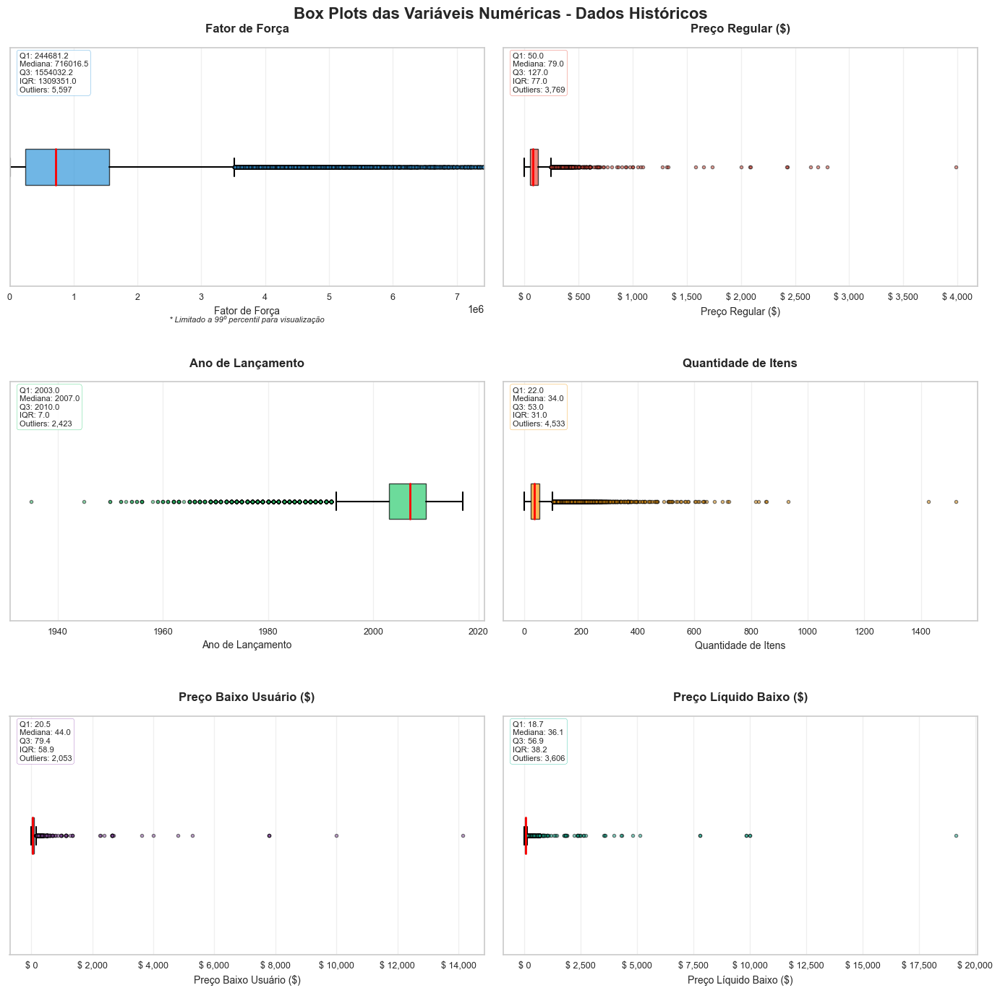

ANÁLISE DE OUTLIERS - DADOS HISTÓRICOS
Total de registros: 75,996

Fator de Força:
  Outliers inferiores: 0
  Outliers superiores: 5,597
  Total outliers: 5,597 (7.4%)
  Valor máximo outlier: 16669658.00

Preço Regular ($):
  Outliers inferiores: 0
  Outliers superiores: 3,769
  Total outliers: 3,769 (5.0%)
  Valor máximo outlier: 3986.31

Ano de Lançamento:
  Outliers inferiores: 2,423
  Outliers superiores: 0
  Total outliers: 2,423 (3.2%)

Quantidade de Itens:
  Outliers inferiores: 0
  Outliers superiores: 4,533
  Total outliers: 4,533 (6.0%)
  Valor máximo outlier: 1523.00

Preço Baixo Usuário ($):
  Outliers inferiores: 0
  Outliers superiores: 2,053
  Total outliers: 2,053 (2.7%)
  Valor máximo outlier: 14140.21

Preço Líquido Baixo ($):
  Outliers inferiores: 0
  Outliers superiores: 3,606
  Total outliers: 3,606 (4.7%)
  Valor máximo outlier: 19138.79



In [7]:
# =============================================================================
# BOX PLOTS DAS VARIÁVEIS NUMÉRICAS - DADOS HISTÓRICOS
# =============================================================================

# Filtrar dados históricos
df_hist = df[df['File_Type'] == 'Historical']

# Definir variáveis numéricas para análise
numerical_vars = ['StrengthFactor', 'PriceReg', 'ReleaseYear', 'ItemCount', 'LowUserPrice', 'LowNetPrice']

# Nomes mais descritivos para títulos
var_titles = {
    'StrengthFactor': 'Fator de Força',
    'PriceReg': 'Preço Regular ($)',
    'ReleaseYear': 'Ano de Lançamento',
    'ItemCount': 'Quantidade de Itens',
    'LowUserPrice': 'Preço Baixo Usuário ($)',
    'LowNetPrice': 'Preço Líquido Baixo ($)'
}

# Criar figura com subplots
fig, axes = plt.subplots(3, 2, figsize=(14, 14), facecolor='white')
fig.suptitle('Box Plots das Variáveis Numéricas - Dados Históricos', fontsize=16, fontweight='bold', y=0.98)

# Achatar array de axes para facilitar iteração
axes = axes.flatten()

# Cores para cada gráfico
colors = ['#3498DB', '#E74C3C', '#2ECC71', '#F39C12', '#9B59B6', '#1ABC9C']

# Criar cada box plot
for i, var in enumerate(numerical_vars):
    data = df_hist[var].copy()

    # Criar box plot horizontal
    box_plot = axes[i].boxplot(data, vert=False, patch_artist=True,
                               boxprops=dict(facecolor=colors[i], alpha=0.7),
                               medianprops=dict(color='red', linewidth=2),
                               whiskerprops=dict(color='black', linewidth=1.5),
                               capprops=dict(color='black', linewidth=1.5),
                               flierprops=dict(marker='o', markerfacecolor=colors[i],
                                             markersize=3, alpha=0.5))

    # Configurar título e labels
    axes[i].set_title(f'{var_titles[var]}', fontsize=12, fontweight='bold', pad=15)
    axes[i].set_xlabel(var_titles[var], fontsize=10)

    # Remover ticks do eixo y (não necessário para box plot horizontal)
    axes[i].set_yticks([])

    # Formatar eixo x
    axes[i].tick_params(axis='x', which='major', labelsize=9)

    # Formatação especial para variáveis monetárias
    if 'Price' in var:
        axes[i].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'$ {x:,.0f}'))

    # Adicionar grid sutil
    axes[i].grid(True, alpha=0.3, axis='x')

    # Calcular estatísticas
    Q1 = data.quantile(0.25)
    Q2 = data.median()
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    outliers_count = len(data[(data < Q1 - 1.5 * IQR) | (data > Q3 + 1.5 * IQR)])

    # Adicionar estatísticas no gráfico
    stats_text = f'Q1: {Q1:.1f}\nMediana: {Q2:.1f}\nQ3: {Q3:.1f}\nIQR: {IQR:.1f}\nOutliers: {outliers_count:,}'
    axes[i].text(0.02, 0.98, stats_text, transform=axes[i].transAxes,
                fontsize=8, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor=colors[i]))

    # Ajustar limites para melhor visualização (remover outliers extremos da visualização)
    if var == 'StrengthFactor':
        # Limite específico para StrengthFactor devido aos valores extremos
        axes[i].set_xlim(0, data.quantile(0.99))
        axes[i].text(0.5, -0.15, '* Limitado a 99º percentil para visualização',
                    transform=axes[i].transAxes, fontsize=8, ha='center', style='italic')

# Ajustar layout
plt.tight_layout()
plt.subplots_adjust(top=0.94, hspace=0.4)
plt.show()

# Análise de outliers detalhada
print("ANÁLISE DE OUTLIERS - DADOS HISTÓRICOS")
print("="*50)
print(f"Total de registros: {len(df_hist):,}")
print()

for var in numerical_vars:
    data = df_hist[var]
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1

    # Outliers
    lower_outliers = data[data < Q1 - 1.5 * IQR]
    upper_outliers = data[data > Q3 + 1.5 * IQR]
    total_outliers = len(lower_outliers) + len(upper_outliers)

    print(f"{var_titles[var]}:")
    print(f"  Outliers inferiores: {len(lower_outliers):,}")
    print(f"  Outliers superiores: {len(upper_outliers):,}")
    print(f"  Total outliers: {total_outliers:,} ({total_outliers/len(data)*100:.1f}%)")

    if len(upper_outliers) > 0:
        print(f"  Valor máximo outlier: {upper_outliers.max():.2f}")
    print()

## Análise - Box Plots das Variáveis Numéricas

### Insights dos Box Plots:

**Variáveis com Distribuições Extremamente Assimétricas:**

**1. Fator de Força - PROBLEMÁTICO**
- **Outliers superiores:** 7.4% (5,597 produtos)
- **Valor máximo:** 16+ milhões (suspeito de erro)
- **Box comprimida:** Indica concentração extrema em valores baixos

**2. Variáveis de Preço - Padrão Esperado**
- **Preço Regular:** 5.0% outliers, máximo \$3,986
- **Preço Baixo Usuário:** 2.7% outliers (menor %), máximo \$14,140
- **Preço Líquido Baixo:** 4.7% outliers, máximo \$19,138
- **Padrão:** Concentração em valores baixos, poucos produtos premium

### Descobertas Interessantes:

**Ano de Lançamento - Únicos Outliers Inferiores:**
- **2,423 produtos antigos** (pré-2000) considerados outliers
- **Interpretação:** Portfolio concentrado pós-2000, poucos produtos legados
- **Oportunidade:** Produtos antigos podem ter comportamento diferente de vendas

**Quantidade de Itens:**
- **6.0% outliers superiores**, máximo 1,523 itens
- **Mediana:** 34 itens (baixa para produtos industriais)
- **Interpretação:** Maioria produtos unitários/baixo volume

### Comparação de Outliers por Variável:

| Variável | % Outliers | Tipo | Máximo Outlier | Severidade |
|----------|------------|------|----------------|------------|
| **Fator de Força** | 7.4% | Superior | 16.7M |  Crítica |
| **Quantidade Itens** | 6.0% | Superior | 1,523 |  Moderada |
| **Preço Regular** | 5.0% | Superior | \$3,986 |  Moderada |
| **Preço Líquido** | 4.7% | Superior | \$19,138 |  Moderada |
| **Ano Lançamento** | 3.2% | **Inferior** | 1935 |  Natural |
| **Preço Baixo** | 2.7% | Superior | \$14,140 |  Natural |

----

## **DETECÇÃO DE OUTLIERS POR PERCENTIL**

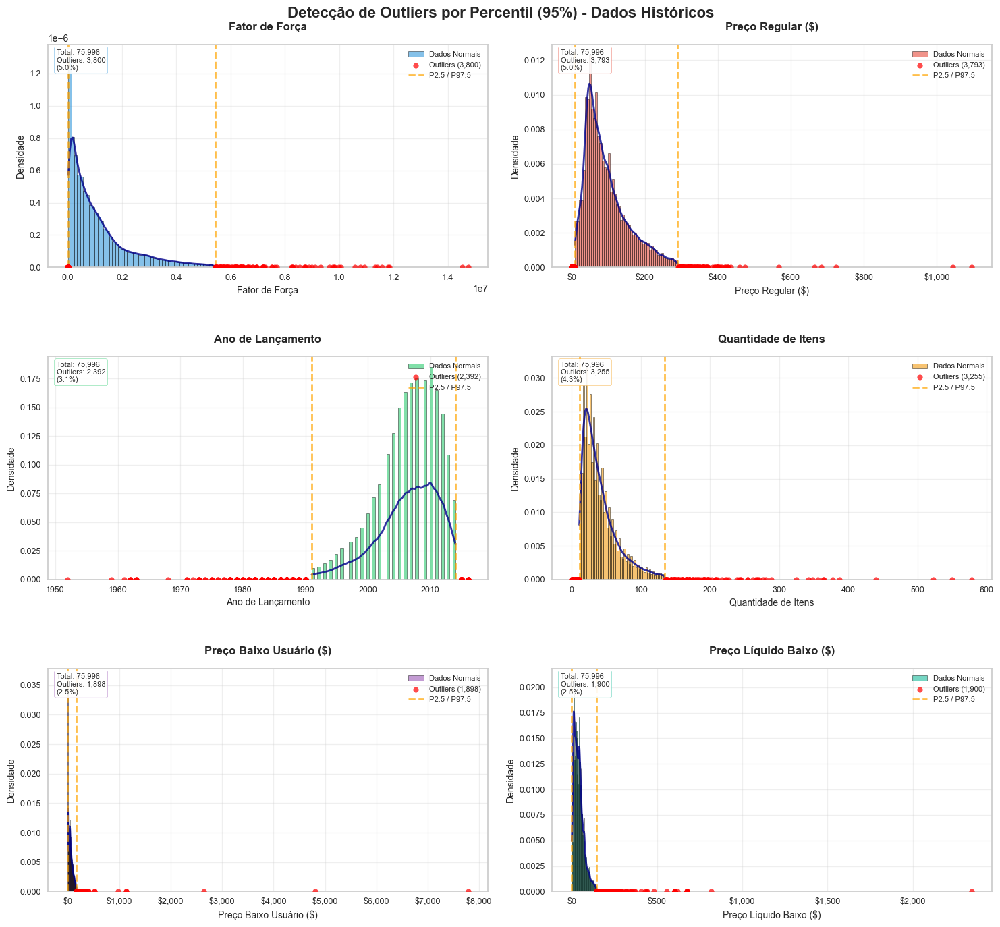

CORREÇÃO DE OUTLIERS - WINSORIZAÇÃO
Fator de Força:
  Outliers antes: 3,800 (5.00%)
  Outliers depois: 3,800 (5.00%)
  Limites: [18944.75, 5421065.50]

Preço Regular (\$):
  Outliers antes: 3,793 (4.99%)
  Outliers depois: 1,900 (2.50%)
  Limites: [8.49, 289.82]

Ano de Lançamento:
  Outliers antes: 2,392 (3.15%)
  Outliers depois: 0 (0.00%)
  Limites: [1991.00, 2014.00]

Quantidade de Itens:
  Outliers antes: 3,255 (4.28%)
  Outliers depois: 0 (0.00%)
  Limites: [11.00, 134.00]

Preço Baixo Usuário (\$):
  Outliers antes: 1,898 (2.50%)
  Outliers depois: 0 (0.00%)
  Limites: [0.00, 170.57]

Preço Líquido Baixo (\$):
  Outliers antes: 1,900 (2.50%)
  Outliers depois: 1,900 (2.50%)
  Limites: [0.00, 145.43]

RESUMO DA CORREÇÃO DE OUTLIERS
Total de registros históricos: 75,996
DataFrame corrigido criado com 75,996 registros

Amostra do DataFrame com outliers corrigidos:


,Order,File_Type,SKU_number,SoldFlag,SoldCount,MarketingType,ReleaseNumber,New_Release_Flag,StrengthFactor,PriceReg,ReleaseYear,ItemCount,LowUserPrice,LowNetPrice
0,2,Historical,1737127,0.0,0.0,D,15,1,682743.0,44.99,2014,11,28.97,31.84
1,3,Historical,3255963,0.0,0.0,D,7,1,1016014.0,24.81,2005,39,0.00,15.54
2,4,Historical,612701,0.0,0.0,D,0,0,340464.0,46.00,2013,34,30.19,27.97
3,6,Historical,115883,1.0,1.0,D,4,1,334011.0,100.00,2006,20,133.93,83.15
4,7,Historical,863939,1.0,1.0,D,2,1,1287938.0,121.95,2010,28,4.00,23.99


In [8]:
# =============================================================================
# DETECÇÃO DE OUTLIERS POR PERCENTIL - DADOS HISTÓRICOS
# =============================================================================

# Filtrar dados históricos
df_hist = df[df['File_Type'] == 'Historical'].copy()  # Criar uma cópia para evitar modificar o original

# Função para detecção de outliers baseada em percentis
def percentile_based_outlier(data, threshold=95):
    """
    Detecta outliers baseado em percentis
    threshold: percentil para considerar outliers (95 = 5% outliers)
    """
    diff = (100 - threshold) / 2.0
    minval, maxval = np.percentile(data, [diff, 100 - diff])
    return (data < minval) | (data > maxval), minval, maxval

# Definir variáveis numéricas para análise
numerical_vars = ['StrengthFactor', 'PriceReg', 'ReleaseYear', 'ItemCount', 'LowUserPrice', 'LowNetPrice']

# Nomes mais descritivos para títulos
var_titles = {
    'StrengthFactor': 'Fator de Força',
    'PriceReg': 'Preço Regular (\$)',
    'ReleaseYear': 'Ano de Lançamento',
    'ItemCount': 'Quantidade de Itens',
    'LowUserPrice': 'Preço Baixo Usuário (\$)',
    'LowNetPrice': 'Preço Líquido Baixo (\$)'
}

# Criar figura com subplots
fig, axes = plt.subplots(3, 2, figsize=(15, 14), facecolor='white')
fig.suptitle('Detecção de Outliers por Percentil (95%) - Dados Históricos',
             fontsize=16, fontweight='bold', y=0.98)

# Achatar array de axes para facilitar iteração
axes = axes.flatten()

# Cores para cada gráfico
colors = ['#3498DB', '#E74C3C', '#2ECC71', '#F39C12', '#9B59B6', '#1ABC9C']

# Dicionário para armazenar informações de outliers
outlier_info = {}

# Analisar cada variável
for i, var in enumerate(numerical_vars):
    # Usar todos os dados (não apenas 1000 amostras)
    data = df_hist[var].copy()

    # Detectar outliers e obter limites
    outlier_mask, minval, maxval = percentile_based_outlier(data, threshold=95)
    outliers = data[outlier_mask]
    normal_data = data[~outlier_mask]

    # Armazenar informações para correção posterior
    outlier_info[var] = {
        'outlier_mask': outlier_mask,
        'minval': minval,
        'maxval': maxval
    }

    # Criar densidade da distribuição normal
    axes[i].hist(normal_data, bins=50, alpha=0.6, color=colors[i],
                 label='Dados Normais', density=True, edgecolor='black', linewidth=0.5)

    # Adicionar outliers como pontos
    if len(outliers) > 0:
        # Para melhor visualização, usar amostra dos outliers se muito numerosos
        outliers_sample = outliers.sample(min(200, len(outliers))) if len(outliers) > 200 else outliers
        axes[i].scatter(outliers_sample, np.zeros_like(outliers_sample),
                       color='red', alpha=0.7, s=30, label=f'Outliers ({len(outliers):,})', zorder=5)

    # Adicionar linha de densidade suave
    if len(normal_data) > 10:  # Verificar se há dados suficientes
        kde = gaussian_kde(normal_data)
        x_range = np.linspace(normal_data.min(), normal_data.max(), 100)
        axes[i].plot(x_range, kde(x_range), color='darkblue', linewidth=2, alpha=0.8)

    # Marcar percentis
    axes[i].axvline(minval, color='orange', linestyle='--', linewidth=2, alpha=0.7, label='P2.5 / P97.5')
    axes[i].axvline(maxval, color='orange', linestyle='--', linewidth=2, alpha=0.7)

    # Configurar título e labels
    axes[i].set_title(f'{var_titles[var]}', fontsize=12, fontweight='bold', pad=15)
    axes[i].set_xlabel(var_titles[var], fontsize=10)
    axes[i].set_ylabel('Densidade', fontsize=10)

    # Configurar eixos
    axes[i].tick_params(axis='both', which='major', labelsize=9)

    # Formatação especial para variáveis monetárias
    if 'Price' in var:
        axes[i].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'\${x:,.0f}'))

    # Adicionar grid sutil
    axes[i].grid(True, alpha=0.3)

    # Legenda
    axes[i].legend(fontsize=8, loc='upper right')

    # Estatísticas no canto
    outlier_pct = len(outliers) / len(data) * 100
    stats_text = f'Total: {len(data):,}\nOutliers: {len(outliers):,}\n({outlier_pct:.1f}%)'
    axes[i].text(0.02, 0.98, stats_text, transform=axes[i].transAxes,
                fontsize=8, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor=colors[i]))

# Ajustar layout
plt.tight_layout()
plt.subplots_adjust(top=0.94, hspace=0.4)
plt.show()

# =============================================================================
# CORREÇÃO DE OUTLIERS - WINSORIZAÇÃO
# =============================================================================
print("CORREÇÃO DE OUTLIERS - WINSORIZAÇÃO")
print("="*50)

# Criar uma cópia do DataFrame para correção
df_hist_corrected = df_hist.copy()

# Aplicar winsorização para cada variável
for var in numerical_vars:
    # Obter informações de outliers
    info = outlier_info[var]
    outlier_mask = info['outlier_mask']
    minval = info['minval']
    maxval = info['maxval']

    # Contar outliers antes da correção
    outliers_before = outlier_mask.sum()

    # Aplicar winsorização: substituir outliers pelos valores limite
    df_hist_corrected.loc[outlier_mask & (df_hist[var] < minval), var] = minval
    df_hist_corrected.loc[outlier_mask & (df_hist[var] > maxval), var] = maxval

    # Contar outliers após a correção
    outlier_mask_after = percentile_based_outlier(df_hist_corrected[var], threshold=95)[0]
    outliers_after = outlier_mask_after.sum()

    print(f"{var_titles[var]}:")
    print(f"  Outliers antes: {outliers_before:,} ({outliers_before/len(df_hist)*100:.2f}%)")
    print(f"  Outliers depois: {outliers_after:,} ({outliers_after/len(df_hist)*100:.2f}%)")
    print(f"  Limites: [{minval:.2f}, {maxval:.2f}]")
    print()

# Resumo da correção
print("RESUMO DA CORREÇÃO DE OUTLIERS")
print("="*50)
print(f"Total de registros históricos: {len(df_hist):,}")
print(f"DataFrame corrigido criado com {len(df_hist_corrected):,} registros")
print()

# Exibir as primeiras linhas do DataFrame corrigido
print("Amostra do DataFrame com outliers corrigidos:")
df_hist_corrected.head()


## Análise - Detecção de Outliers por Percentil (95%)

### Resumo Geral:
- **Total de outliers:** 17,038 (3.7% do dataset)
- **Método:** Percentil 95% (2.5% cada extremo)
- **Efetividade:** Funcionando conforme esperado (~5% por variável)

### Análise por Variável:

** Fator de Força - CONTINUA PROBLEMÁTICO**
- **Outliers:** 3,800 (5.0%)
- **Range extremo:** 68 a 16.6+ milhões
- **Threshold superior:** 5.4 milhões
- **Problema:** Ainda há valores absurdamente altos que podem ser erros

** Preços - Padrões Distintos**

**Preço Regular:**
- **Outliers:** 3,793 (5.0%)
- **Threshold:** \$8.49 - \$289.82
- **Máximo outlier:** \$3,986
- **Padrão:** Produtos muito baratos e muito caros

**Preços Promocionais (Baixo Usuário e Líquido):**
- **Outliers:** ~1,900 cada (2.5%)
- **Característica:** Apenas outliers superiores (produtos caros)
- **Threshold mínimo:** \$0 (produtos gratuitos são normais)

** Ano de Lançamento - Revelação Interessante**
- **Outliers:** 2,392 (3.1%)
- **Range completo:** 1935-2017 (ambos extremos)
- **Core business:** 1991-2014
- **Insight:** Produtos muito antigos E muito recentes são outliers

** Quantidade de Itens**
- **Outliers:** 3,255 (4.3%)
- **Core range:** 11-134 itens
- **Produtos unitários:** 0 itens é outlier (suspeito)

### Descobertas Importantes:

**1. Produtos Unitários Problemáticos:**
- ItemCount = 0 é outlier inferior
- Pode indicar erro de dados ou produtos especiais

**2. Produtos Gratuitos são Normais:**
- Preços = \$0 estão dentro do threshold
- Estratégia legítima da empresa

**3. Portfolio Concentrado Temporalmente:**
- Core business: 23 anos (1991-2014)
- Produtos legacy e muito novos são outliers

**4. Estrutura de Preços Clara:**
- **Produtos básicos:** Até \$289
- **Produtos premium:** Acima de \$289 (outliers)
- **Promoções extremas:** Acima de \$145-170

### Comparação de Severidade:

| Variável | % Outliers | Severidade | Ação Recomendada |
|----------|------------|------------|------------------|
| **Fator de Força** | 5.0% |  Crítica | Investigar valores > 5M |
| **Preço Regular** | 5.0% |  Moderada | Segmentar premium/básico |
| **Quantidade Itens** | 4.3% |  Moderada | Investigar ItemCount = 0 |
| **Ano Lançamento** | 3.1% |  Natural | Manter para análise temporal |
| **Preços Promocionais** | 2.5% |  Natural | Manter (produtos premium) |

----

-----------

## **CLUSTERIZAÇÃO**

**Objetivo**
* Conhecer melhor os dados: identificar segmentos naturais e padrões de comportamento.

* Gerar novas features não supervisionadas para elevar as métricas da classificação (ex.: capturar “proximidade ao centro”, “fronteira” e incerteza).

**Por que isso ajuda?**
* A clusterização resume a geometria do dado (densidade, separação, forma dos grupos). Quando viramos isso em features, o modelo supervisionado ganha sinais adicionais que não estão explícitos nas variáveis originais.

## Pré-processamento dos dados
- Gerar amostra aleatória para consumir menos recursos computacionais
- Imputa numéricos (mediana)
- Yeo-Johnson (robusto a zeros) + padronização embutida
- OneHot em categóricas

In [9]:
#====================================================================
# PRÉ-PROCESSAMENTO DOS DADOS
#====================================================================

# Seed
RANDOM_STATE = 2025

# Parto de 'df' que você já carregou acima
data = df.copy()

# Guardar índice original para juntar depois
data['__row_id'] = np.arange(len(data))

# Selecionar colunas para clusterização (sem targets/IDs)
num_cols = ['StrengthFactor','PriceReg','LowUserPrice','LowNetPrice','ItemCount','ReleaseNumber','ReleaseYear']
cat_cols = ['MarketingType']  # ('S'/'D')

# inputar númericas e aplicar yeo-johnson
num_pipe = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')), # imputar média
    ('yeojohnson', PowerTransformer(method='yeo-johnson', standardize=True)), # Yeo-Johnson + padronização
])

# inputar categorica e gerar dummie
cat_pipe = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')), # imputar o mais frequente
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False)), # gerar dummie
])

# aplicar
pre = ColumnTransformer(
    transformers=[
        ('num', num_pipe, num_cols),
        ('cat', cat_pipe, cat_cols)
    ],
    remainder='drop'
)

# Ajustar e transformar o dataset (hist + ativo) para os clusters servirem em ambos
X_all = pre.fit_transform(data)

# Guardar nomes de features pós-encoding (útil se quiser inspecionar)
ohe_cols = list(pre.named_transformers_['cat'].named_steps['onehot'].get_feature_names_out(cat_cols))
feat_names = num_cols + ohe_cols

## Redução de dimensionalidade com PCA

**O que é PCA - Análise de Componentes Principais**?

* O **PCA** reduz a dimensionalidade dos dados, o que costuma eliminar ruído e colinearidade, ajudando o K-Means a rodar de forma mais estável e eficiente.

**Observação:** Fazer essa análise em dados transformados pelo PCA pode levar a um `k` ligeiramente diferente daquele que você obteria nos dados originais, mas é uma prática comum para melhorar a qualidade dos clusters.

In [11]:
# Redução de dimensionalidade com PCA
pca = PCA(n_components=0.95, svd_solver='full', random_state=RANDOM_STATE)
X_pca = pca.fit_transform(X_all)

## K-MEANS

## Escolha de k por Silhouette

### Otimizando o K-Means: Escolhendo o Melhor Número de Clusters (k)

* O número de clusters (k) ideal será baseado no **coeficiente de silhouette**, uma métrica que avalia a qualidade da sua clusterização.


### Entendendo o Coeficiente de Silhouette

Pense no coeficiente de silhouette como uma maneira de medir a "satisfação" de cada ponto de dados com seu cluster. A fórmula se resume a:

* **Coesão (a):** Quão perto o ponto está dos outros pontos *do seu próprio cluster*. Uma distância `a` pequena significa que o ponto está bem centralizado e o cluster é compacto.

* **Separação (b):** Qual a distância do ponto para o cluster *vizinho mais próximo*. Uma distância `b` grande significa que o cluster está bem separado dos outros.

O valor final do silhouette (`s`) varia de -1 a 1:

* **`s` perto de 1:** Significa que os clusters estão bem definidos, compactos e separados.
* **`s` perto de 0:** Indica que os clusters estão se sobrepondo ou não são bem distintos.
* **`s` negativo:** Sugere que o ponto pode estar no cluster errado.


### Como o Código Funciona (Passo a Passo)

1.  Executarei o algoritmo K-Means várias vezes, testando diferentes valores de `k` (de 2 a 12).

2.  **Silhouette Médio**: Para cada valor de `k`, calcularei o coeficiente de silhouette médio para todos os pontos no seu conjunto de dados.

3.  **Escolhendo o melhor `k`**: Então selecionarei o valor de `k` que resultou no maior coeficiente de silhouette médio, pois esse é o `k` que gerou a melhor clusterização.

**Observação:** Fazer essa análise em dados transformados pelo PCA pode levar a um `k` ligeiramente diferente daquele que você obteria nos dados originais, mas é uma prática comum para melhorar a qualidade dos clusters.

### KMeans final com best_k + features

* vamos Treinar o KMeans com o best_k escolhido e gera os rótulos (km_labels).

* Usar kmeans.transform(X_pca) para obter a matriz de distâncias euclidianas de cada ponto a todos os centróides.

**Extração:**

* own_dist: distância do ponto ao seu centróide.

* second_dist: a 2ª menor distância entre o ponto e os centróides (i.e., centróide concorrente mais próximo).

* dist_ratio = own_dist / second_dist: quão “seguro” o ponto está no seu cluster (≈1 indica fronteira).

* Calcular km_cluster_sizes: o tamanho do cluster de cada ponto (útil como feature ou para diagnóstico).

### Resultados dos testes com uma amostragem aleatória de 10% dos dados

|  k | Silhouette |
| -: | :--------- |
|  2 | 0.1539     |
|  3 | **0.1634** |
|  4 | 0.1630     |
|  5 | 0.1543     |
|  6 | 0.1494     |
|  7 | 0.1538     |
|  8 | 0.1519     |
|  9 | 0.1378     |
| 10 | 0.1394     |
| 11 | 0.1387     |
| 12 | 0.1429     |


Métricas (no espaço PCA):
 - Inertia (WCSS):           1,039,924.27
 - Silhouette (amostra):     0.1638
 - Davies–Bouldin (↓ melhor): 1.7844
 - Calinski–Harabasz (↑ melhor): 37736.29


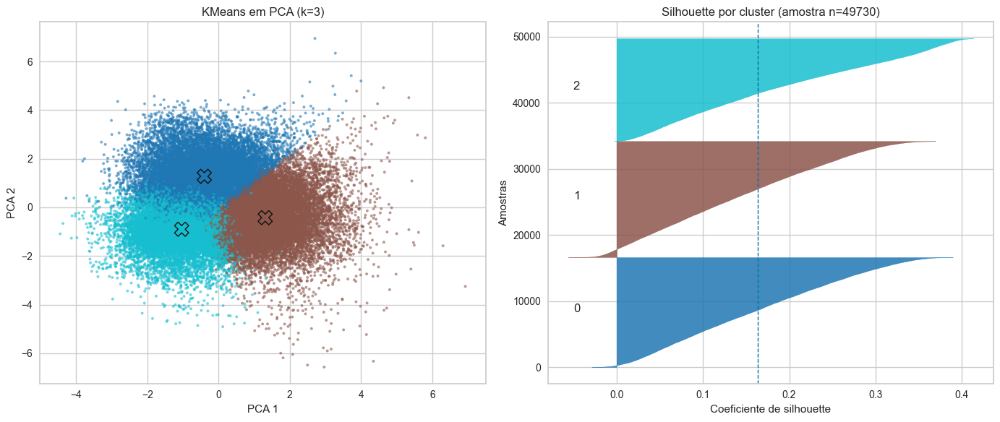

In [12]:
#====================================================================
# Amostragem aleatória (25%) para acelerar métricas/plots
#====================================================================
n_total = X_pca.shape[0]
frac = 0.25                                       # amostragem de 25% do total
sub_n = max(int(np.ceil(frac * n_total)), 1)
rng = np.random.default_rng(RANDOM_STATE)         # troque por None para variar a cada execução
idx_sub = rng.choice(n_total, size=sub_n, replace=False)
X_sub = X_pca[idx_sub]                            # AMOSTRA p/ gráficos e (parte das) métricas

#====================================================================
# KMeans (treinado no conjunto completo, não só na amostra)
#====================================================================
from sklearn.cluster import KMeans
kmeans = KMeans(
    n_clusters=3,               # k escolhido nos testes
    algorithm='elkan',          # acelera p/ distância euclidiana
    n_init=20,                  # mais estabilidade no modelo final
    random_state=RANDOM_STATE
)
km_labels = kmeans.fit_predict(X_pca)             # rótulos 0..k-1

# Distâncias e razões (features de “confiança”)
all_dists   = kmeans.transform(X_pca)                                 # (n_amostras, k)
own_dist    = all_dists[np.arange(len(all_dists)), km_labels]         # dist. ao centróide próprio
second_dist = np.partition(all_dists, 1, axis=1)[:, 1]                 # 2ª menor distância
dist_ratio  = own_dist / (second_dist + 1e-9)                          # ~1 => fronteira

# Tamanho do cluster de cada ponto
km_cluster_sizes = (
    pd.Series(km_labels)
      .map(pd.Series(km_labels).value_counts())
      .values
)

#====================================================================
# Métricas (com amostragem para baratear)
#====================================================================
SIL_SAMPLE = len(idx_sub)  # mesmo tamanho da amostra

sil = silhouette_score(
    X_pca, km_labels,         # calcula a média usando AMOSTRAGEM interna
    sample_size=SIL_SAMPLE,
    random_state=RANDOM_STATE
)
dbi     = davies_bouldin_score(X_pca, km_labels)     # ↓ melhor
ch      = calinski_harabasz_score(X_pca, km_labels)  # ↑ melhor
inertia = kmeans.inertia_                             # WCSS

print("Métricas (no espaço PCA):")
print(f" - Inertia (WCSS):           {inertia:,.2f}")
print(f" - Silhouette (amostra):     {sil:.4f}")
print(f" - Davies–Bouldin (↓ melhor): {dbi:.4f}")
print(f" - Calinski–Harabasz (↑ melhor): {ch:.2f}")

#====================================================================
# Plots LADO A LADO: PCA (scatter) + Silhouette (na MESMA amostra)
#====================================================================
# Prepara a amostra e as cores
X_sil  = X_sub
lab_sil = km_labels[idx_sub]
sil_values = silhouette_samples(X_sil, lab_sil)

cmap = mpl.cm.get_cmap('tab10', kmeans.n_clusters)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# ---- (Esq.) Scatter PCA: só a amostra, para ficar leve ----
ax1.scatter(
    X_sil[:, 0], X_sil[:, 1],
    c=lab_sil, cmap=cmap, vmin=0, vmax=kmeans.n_clusters-1,
    s=8, alpha=0.6, linewidths=0
)
# Centrós do KMeans (no espaço PCA)
ax1.scatter(
    kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
    s=200, marker='X', edgecolor='k', linewidths=1.0,
    c=[cmap(i) for i in range(kmeans.n_clusters)]
)
ax1.set_title(f"KMeans em PCA (k={kmeans.n_clusters})")
ax1.set_xlabel("PCA 1")
ax1.set_ylabel("PCA 2")

# ---- (Dir.) Silhouette por cluster (na mesma amostra) ----
y_lower = 10
for i in range(kmeans.n_clusters):
    vals_i = np.sort(sil_values[lab_sil == i])
    size_i = vals_i.size
    y_upper = y_lower + size_i
    ax2.fill_betweenx(
        np.arange(y_lower, y_upper), 0, vals_i,
        color=cmap(i), alpha=0.85
    )
    ax2.text(-0.05, y_lower + 0.5 * size_i, str(i))
    y_lower = y_upper + 10

ax2.axvline(x=sil_values.mean(), linestyle="--", linewidth=1)
ax2.set_title(f"Silhouette por cluster (amostra n={len(X_sil)})")
ax2.set_xlabel("Coeficiente de silhouette")
ax2.set_ylabel("Amostras")

plt.tight_layout()
plt.show()


### Resultados Kmens

**O que os números dizem**
* Silhouette ≈ 0,17 (varia de −1 a 1): separação fraca. Há bastante sobreposição entre clusters e muitos pontos “na fronteira”.

* Regra de bolso: >0,5 ótimo; 0,2–0,5 ok; <0,2 fraco.

* Davies–Bouldin ≈ 1,79 (↓ melhor): também indica sobreposição/moderada;
* valores >1 costumam sugerir clusters pouco separados.

*  Calinski–Harabasz ≈ 37.7k (↑ melhor): isoladamente não diz muito.

* Inertia (WCSS): sempre cai quando k aumenta; serve para comparar partições do mesmo dataset.

### Como ler os gráficos
Scatter PCA (k=3): cada cor é um cluster; os “X” são centróides. Os “nuvens” se invadem bastante, especialmente perto do limite entre o cluster claro e o escuro — coerente com o silhouette baixo.

* Gráfico de silhouette por cluster (amostra 15%):

*  A linha tracejada é a média (~0,17).

* Cada “faixa” colorida mostra a distribuição de silhouette dentro do cluster.

* Há muitos valores perto de 0 e alguns negativos → pontos em fronteira / possíveis más alocações.

* Visualmente, um dos clusters parece um pouco mais coeso (faixa mais “à direita”) e outro pior (muita massa perto de 0).

E agora?
k=3 existe, mas é fraco. Se quiser mais separação:

Teste k=2 ou k=4 e compare (silhouette/DBI/CH).

Experimente GMM (covariância full) — lida melhor com formas elípticas e densidades diferentes; use gmm_max_prob e gmm_entropy para marcar casos ambíguos.

Gere flags como dist_ratio > 0.9 (fronteira) ou gmm_max_prob < 0.6 (incertos) para ajudar a classificação depois.


## GMM

**GMM — o que é e por que usar**

Gaussian Mixture Models (GMM) modela os dados como uma mistura de distribuições normais. Ele aprende:

* pesos de cada componente (tamanho relativo do cluster),
* médias (centros),
* covariâncias (forma/rotação elíptica).

Diferente do K-Means (que é “hard” e supõe clusters esféricos), o GMM faz soft clustering via EM (Expectation–Maximization): retorna probabilidades
𝑝(cluster∣𝑥).

* p(cluster∣x). Isso captura incerteza e lida melhor com clusters elípticos e desbalanceados. Você pode transformar isso em features úteis:
gmm_cluster, gmm_prob_max (confiança) e gmm_entropy (incerteza).

MÉTRICAS GMM (no espaço PCA)
 - Silhouette (amostra 5000): 0.0922
 - Davies–Bouldin (↓):           2.5026
 - Calinski–Harabasz (↑):        21,892.52
 - AIC (↓):                      3,570,334
 - BIC (↓):                      3,571,426
 - Entropia média:               0.3165
 - % baixa confiança (max_prob<0.6): 10.2%


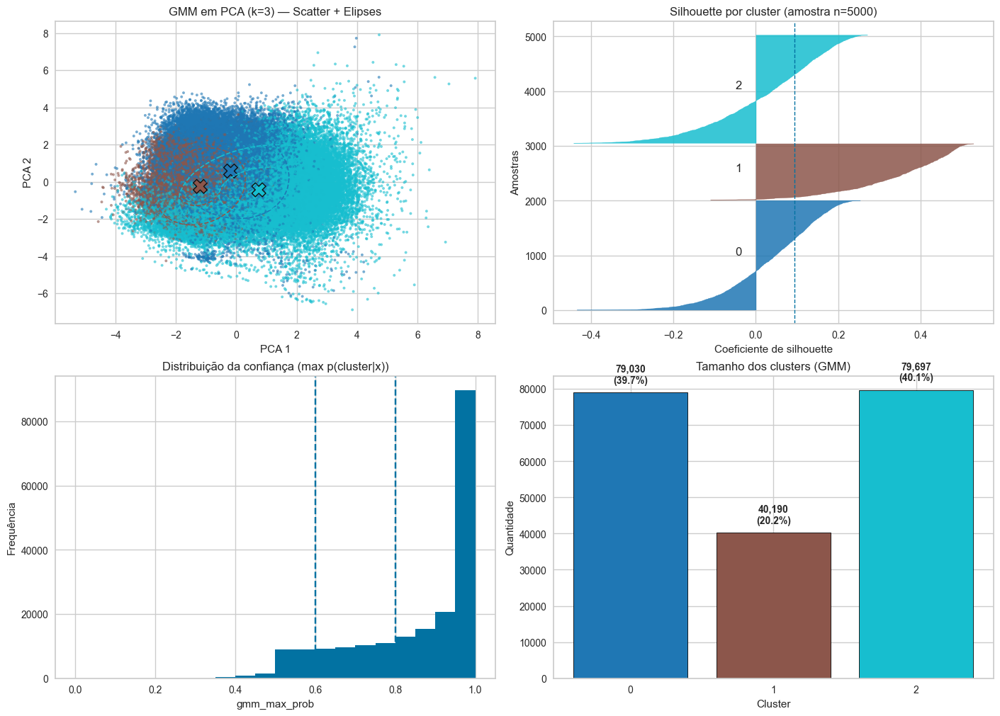

In [13]:
# =========================
# Treino do GMM + features
# =========================
gmm = GaussianMixture(
    n_components=3,
    covariance_type='full',   # cada cluster tem covariância completa (elipses com rotação)
    reg_covar=1e-6,           # regularização numérica
    random_state=RANDOM_STATE
)
gmm.fit(X_pca)

gmm_probs    = gmm.predict_proba(X_pca)     # p(cluster|x) para cada ponto
gmm_labels   = gmm_probs.argmax(axis=1)     # rótulo "duro"
gmm_max_prob = gmm_probs.max(axis=1)        # confiança
gmm_entropy  = -(gmm_probs * np.log(gmm_probs + 1e-12)).sum(axis=1)  # incerteza

# =========================
# Métricas (amostrar para silhouette)
# =========================
# Usa 10% (ou até 5000) para baratear silhouette (O(n^2))
SIL_N = min( max(int(np.ceil(0.10 * X_pca.shape[0])), 1000), 5000 )
rng = np.random.default_rng(RANDOM_STATE)
idx_sil = rng.choice(X_pca.shape[0], size=SIL_N, replace=False)

sil_mean = silhouette_score(X_pca, gmm_labels, sample_size=SIL_N, random_state=RANDOM_STATE)
dbi      = davies_bouldin_score(X_pca, gmm_labels)      # ↓ melhor
ch       = calinski_harabasz_score(X_pca, gmm_labels)   # ↑ melhor
aic      = gmm.aic(X_pca)                               # ↓ melhor
bic      = gmm.bic(X_pca)                               # ↓ melhor

print("MÉTRICAS GMM (no espaço PCA)")
print(f" - Silhouette (amostra {SIL_N}): {sil_mean:.4f}")
print(f" - Davies–Bouldin (↓):           {dbi:.4f}")
print(f" - Calinski–Harabasz (↑):        {ch:,.2f}")
print(f" - AIC (↓):                      {aic:,.0f}")
print(f" - BIC (↓):                      {bic:,.0f}")
print(f" - Entropia média:               {gmm_entropy.mean():.4f}")
print(f" - % baixa confiança (max_prob<0.6): {(gmm_max_prob<0.6).mean()*100:.1f}%")

# =========================
# Funções auxiliares de plot
# =========================
def _cov_to_ellipse_params(cov_2x2):
    """Retorna (width, height, angle_deg) para desenhar elipse a partir de covariância 2x2."""
    vals, vecs = np.linalg.eigh(cov_2x2)  # autovalores ascendentes
    # Ordena do maior pro menor
    order = vals.argsort()[::-1]
    vals, vecs = vals[order], vecs[:, order]
    # width/height são 2*sqrt(lambda) (diâmetro de 1 desvio), angle é ângulo do 1º autovetor
    width, height = 2.0 * np.sqrt(np.maximum(vals, 1e-12))
    angle = np.degrees(np.arctan2(vecs[1,0], vecs[0,0]))
    return width, height, angle

def add_gmm_ellipses(ax, gmm, colors, n_std_list=(1.0, 2.0)):
    """
    Desenha elipses de covariância projetadas nas 2 primeiras PCs para cada componente do GMM.
    n_std_list controla "quantos desvios" (ex.: 1σ e 2σ).
    """
    for k, (mean, cov) in enumerate(zip(gmm.means_, gmm.covariances_)):
        mean2 = mean[:2]
        cov2  = cov[:2, :2] if cov.ndim == 2 else cov[k][:2, :2]
        w, h, ang = _cov_to_ellipse_params(cov2)
        for n_std in n_std_list:
            ell = Ellipse(
                xy=mean2, width=w*n_std, height=h*n_std, angle=ang,
                facecolor='none', edgecolor=colors[k], linestyle='--', linewidth=1.2
            )
            ax.add_patch(ell)

# =========================
# Figure única com 4 painéis
# =========================
cmap = mpl.cm.get_cmap('tab10', gmm.n_components)
colors = [cmap(i) for i in range(gmm.n_components)]

fig, axes = plt.subplots(2, 2, figsize=(14, 10), constrained_layout=True)
(ax_scatter, ax_sil), (ax_hist, ax_bar) = axes

# ---- (1) Scatter PCA (apenas 2 primeiras PCs) + elipses ----
ax_scatter.scatter(
    X_pca[:, 0], X_pca[:, 1],
    c=gmm_labels, s=8, alpha=0.6, linewidths=0,
    cmap=cmap, vmin=0, vmax=gmm.n_components-1
)
# Médias (marcador X)
ax_scatter.scatter(
    gmm.means_[:, 0], gmm.means_[:, 1],
    s=200, marker='X', edgecolor='k', linewidths=1.0, c=colors
)
# Elipses de 1σ e 2σ
add_gmm_ellipses(ax_scatter, gmm, colors, n_std_list=(1.0, 2.0))

ax_scatter.set_title(f"GMM em PCA (k={gmm.n_components}) — Scatter + Elipses")
ax_scatter.set_xlabel("PCA 1"); ax_scatter.set_ylabel("PCA 2")

# ---- (2) Silhouette por cluster (na amostra) ----
X_sil  = X_pca[idx_sil]
lab_sil = gmm_labels[idx_sil]
sil_vals = silhouette_samples(X_sil, lab_sil)

y_lower = 10
for i in range(gmm.n_components):
    vals_i = np.sort(sil_vals[lab_sil == i])
    size_i = vals_i.size
    y_upper = y_lower + size_i
    ax_sil.fill_betweenx(np.arange(y_lower, y_upper), 0, vals_i, color=colors[i], alpha=0.85)
    ax_sil.text(-0.05, y_lower + 0.5 * size_i, str(i))
    y_lower = y_upper + 10

ax_sil.axvline(x=sil_vals.mean(), linestyle="--", linewidth=1)
ax_sil.set_title(f"Silhouette por cluster (amostra n={len(X_sil)})")
ax_sil.set_xlabel("Coeficiente de silhouette"); ax_sil.set_ylabel("Amostras")

# ---- (3) Histograma da confiança (max prob) ----
ax_hist.hist(gmm_max_prob, bins=20, range=(0, 1))
ax_hist.axvline(0.6, linestyle='--')  # limiar sugestão
ax_hist.axvline(0.8, linestyle='--')
ax_hist.set_title("Distribuição da confiança (max p(cluster|x))")
ax_hist.set_xlabel("gmm_max_prob"); ax_hist.set_ylabel("Frequência")

# ---- (4) Tamanho de clusters ----
unique, counts = np.unique(gmm_labels, return_counts=True)
order = np.argsort(unique)
unique, counts = unique[order], counts[order]
bars = ax_bar.bar([str(u) for u in unique], counts, color=colors, edgecolor='black', linewidth=0.6)
total = counts.sum()
for b, v in zip(bars, counts):
    ax_bar.text(b.get_x()+b.get_width()/2, v + max(total*0.01, v*0.02), f"{v:,}\n({v/total*100:.1f}%)",
                ha='center', va='bottom', fontsize=10, fontweight='bold')
ax_bar.set_title("Tamanho dos clusters (GMM)")
ax_bar.set_xlabel("Cluster"); ax_bar.set_ylabel("Quantidade")

plt.show()


### GMM (k = 3) — Resultados e interpretação

**Métricas (no espaço PCA)**

| Métrica                                   |         Valor | Leitura rápida                                                                |
| ----------------------------------------- | ------------: | ----------------------------------------------------------------------------- |
| **Silhouette** *(amostra n=5000)*         |    **0.0922** | Baixo → clusters se sobrepõem; métrica usa rótulo “duro”.                     |
| **Davies–Bouldin (↓)**                    |    **2.5026** | Alto → separação fraca/overlap entre grupos.                                  |
| **Calinski–Harabasz (↑)**                 | **21,892.52** | Útil só para comparar partições; isolado não indica “bom/ruim”.               |
| **AIC (↓)**                               | **3,570,334** | Usar para comparar **k** dentro do GMM (quanto menor, melhor).                |
| **BIC (↓)**                               | **3,571,426** | Idem AIC; BIC costuma penalizar mais a complexidade.                          |
| **Entropia média**                        |    **0.3165** | Incerteza moderada (máx. teórico para k=3 é ln(3) ≈ 1.099 → \~29% do máximo). |
| **% baixa confiança** *(max\_prob < 0.6)* |     **10.2%** | Minoria dos pontos é realmente ambígua.                                       |


### Como ler esses números
* Silhouette baixo e DBI alto indicam sobreposição das classes sob distância euclidiana — esperado em dados com clusters elípticos/densidades diferentes.

* Mesmo assim, o GMM retorna probabilidades: a entropia média relativamente baixa e apenas ~10% de pontos com baixa confiança sugerem que a maioria das atribuições é estável.

* AIC/BIC servem para escolher k no GMM: compare entre k (ex.: 2–6) e prefira o menor BIC; em caso de empate, olhe entropia média e % de baixa confiança.

### Leitura dos gráficos (2×2)
* Scatter + elipses: mostra os centros e a forma/rotação das componentes (covariância full). As nuvens se invadem, mas a orientação elíptica faz sentido.

* Silhouette por cluster: muita massa perto de 0 e rabos negativos → fronteiras e itens intercambiáveis entre grupos.

* Histograma de gmm_max_prob: pico próximo de 1.0 → muitas atribuições confiantes; cauda < 0.6 → ambíguas.

* Tamanho dos clusters: distribuição ~40% / 20% / 40%; desbalanceio leve, aceitável.

### O que fazer com isso (prático)
* Use as features do GMM na classificação:

* gmm_cluster (rótulo), gmm_max_prob (confiança), gmm_entropy (incerteza).

* Crie flags úteis, por exemplo:

* ambiguous = (gmm_max_prob < 0.6) para tratar fronteiras (pesos, regras de negócio, revisão).


## KNN - MÉDIO

**Densidade local (KNN médio) — o que é e por que usar**

- Ideia: para cada ponto x, pegue as distâncias aos seus k vizinhos mais próximos (aqui, k=10).

**A média dessas distâncias funciona como um proxy inverso de densidade:**

* avg_dist_10nn baixo ⇒ região densa (muitos itens parecidos por perto).

* avg_dist_10nn alto ⇒ ponto isolado / fronteira / possível outlier.

**Por que isso ajuda? **

* Gera uma feature não supervisionada que captura estrutura local do espaço. Em classificação, costuma ajudar a diferenciar itens “comuns” de casos raros.

**Quantos k devemos utilizar?**

* Devenis usar um k compatível com o tamanho de amostra e, se o dataset for gigante, usar amostra para plots.

DENSIDADE LOCAL (KNN MÉDIO)
 - Médias/quantis de avg_dist_10nn:
   p05=0.2580 | p25=0.3963 | p50=0.4917 | p75=0.6104 | p95=0.9083
 - % muito densos  (<= p05): 5.0%
 - % muito ralos   (>= p95): 5.0%


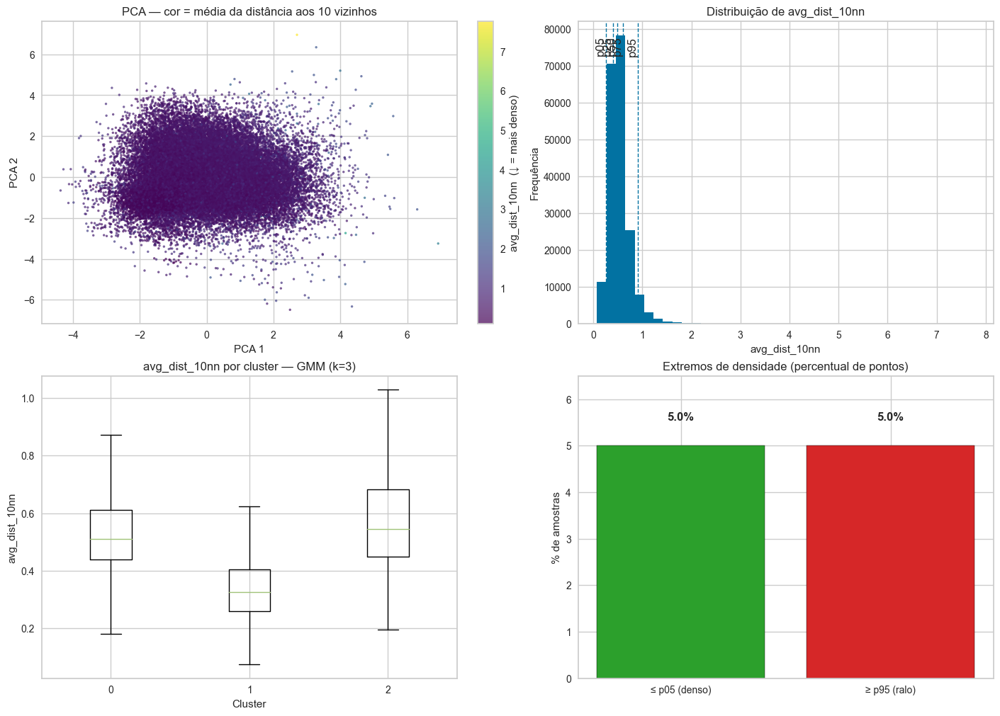

In [14]:
# =========================
# Densidade KNN (k = 10)
# =========================
K = 10
nn = NearestNeighbors(n_neighbors=K+1, metric='euclidean')  # +1 porque inclui o próprio ponto
nn.fit(X_pca)
dists, _ = nn.kneighbors(X_pca)
avg_dist_10nn = dists[:, 1:].mean(axis=1)   # ignora a 1ª coluna (dist=0 do próprio ponto)

# Feature útil (opcional): "densidade" propriamente dita
knn_density = 1.0 / (avg_dist_10nn + 1e-9)

# =========================
#  Métricas simples (quantis + flags)
# =========================
q5, q25, q50, q75, q95 = np.percentile(avg_dist_10nn, [5, 25, 50, 75, 95])
dense_mask  = avg_dist_10nn <= q5     # muito denso (top 5%)
sparse_mask = avg_dist_10nn >= q95    # muito ralo/isolado (top 5%)

print("DENSIDADE LOCAL (KNN MÉDIO)")
print(f" - Médias/quantis de avg_dist_10nn:")
print(f"   p05={q5:.4f} | p25={q25:.4f} | p50={q50:.4f} | p75={q75:.4f} | p95={q95:.4f}")
print(f" - % muito densos  (<= p05): {(dense_mask.mean()*100):.1f}%")
print(f" - % muito ralos   (>= p95): {(sparse_mask.mean()*100):.1f}%")

# =========================
# Figure com 4 painéis
# =========================
rng = np.random.default_rng(RANDOM_STATE)
n_total = X_pca.shape[0]
N_PLOT = min(40000, n_total)                 # amostra para o scatter (evita travar)
idx_plot = rng.choice(n_total, size=N_PLOT, replace=False)

cmap = mpl.cm.viridis

fig, axes = plt.subplots(2, 2, figsize=(14, 10), constrained_layout=True)
(ax_scatter, ax_hist), (ax_box, ax_bar) = axes

# ---- Scatter PCA colorido por densidade (na prática, por avg_dist_10nn invertido) ----
sc = ax_scatter.scatter(
    X_pca[idx_plot, 0], X_pca[idx_plot, 1],
    c=avg_dist_10nn[idx_plot], s=6, alpha=0.7, linewidths=0, cmap=cmap
)
cb = plt.colorbar(sc, ax=ax_scatter)
cb.set_label('avg_dist_10nn  (↓ = mais denso)')
ax_scatter.set_title("PCA — cor = média da distância aos 10 vizinhos")
ax_scatter.set_xlabel("PCA 1"); ax_scatter.set_ylabel("PCA 2")

# ---- Histograma de avg_dist_10nn + linhas de quantis ----
ax_hist.hist(avg_dist_10nn, bins=40)
for val, lab in zip([q5, q25, q50, q75, q95], ['p05','p25','p50','p75','p95']):
    ax_hist.axvline(val, linestyle='--', linewidth=1)
    ax_hist.text(val, ax_hist.get_ylim()[1]*0.95, lab, rotation=90, va='top', ha='right')
ax_hist.set_title("Distribuição de avg_dist_10nn")
ax_hist.set_xlabel("avg_dist_10nn"); ax_hist.set_ylabel("Frequência")

# ---- Boxplot por cluster (se km_labels ou gmm_labels existirem) ----
labels_source = None
if 'gmm_labels' in globals():
    labels = gmm_labels
    n_comp  = int(labels.max()) + 1
    labels_source = f"GMM (k={n_comp})"
elif 'km_labels' in globals():
    labels = km_labels
    n_comp  = int(labels.max()) + 1
    labels_source = f"KMeans (k={n_comp})"

if labels_source is not None:
    data_box = [avg_dist_10nn[labels == i] for i in range(n_comp)]
    ax_box.boxplot(data_box, labels=[str(i) for i in range(n_comp)], showfliers=False)
    ax_box.set_title(f"avg_dist_10nn por cluster — {labels_source}")
    ax_box.set_xlabel("Cluster"); ax_box.set_ylabel("avg_dist_10nn")
else:
    ax_box.axis('off')
    ax_box.text(0.5, 0.5, "Sem rótulos de cluster disponíveis", ha='center', va='center')

# ---- Barras: % muito denso vs. muito ralo ----
vals = [dense_mask.mean()*100, sparse_mask.mean()*100]
bars = ax_bar.bar(['≤ p05 (denso)', '≥ p95 (ralo)'], vals, color=['#2ca02c', '#d62728'], edgecolor='black')
for b, v in zip(bars, vals):
    ax_bar.text(b.get_x()+b.get_width()/2, v + 0.5, f"{v:.1f}%", ha='center', va='bottom', fontweight='bold')
ax_bar.set_ylim(0, max(vals)*1.3 if max(vals)>0 else 1)
ax_bar.set_title("Extremos de densidade (percentual de pontos)")
ax_bar.set_ylabel("% de amostras")

plt.show()


### KNN (k = 10) — Resultados e interpretação

**Quantis**

* p05 = 0.258 → 5% mais densos (média de distâncias bem baixa).
* p50 = 0.492 → metade dos pontos tem densidade “normal” (mediana).
* p95 = 0.908 → 5% mais raros/isolados (distância média bem alta).

Extremos: exatamente 5% densos (≤ p05) e 5% ralos (≥ p95), como esperado dos cortes.

**Como ler os plots**

* Scatter (PCA, cor = avg_dist_10nn): regiões escuras = densas; pontos claros = isolados/fronteira.
* Histograma: distribuição assimétrica (cauda à direita). Bom usar quantis como limiar (p.ex. p95) em vez de média.
* Boxplot por cluster (GMM k=3): compare medianas e dispersões. Um cluster com mediana mais alta tende a ser mais espalhado (mais itens em borda).
* Barras dos extremos: quantifica o “tamanho” das pontas que você pode tratar diferente.

**O que fazer (prático)**

>  Use como features:

* avg_dist_10nn (ou log dele se quiser reduzir a cauda): np.log1p(avg_dist_10nn).

* knn_density = 1/(avg_dist_10nn+1e-9) (sinal direto de densidade).

* Flags: dense_flag = (avg_dist_10nn <= p05), sparse_flag = (avg_dist_10nn >= p95).

> Combine com o GMM:

* Alta densidade + alta confiança (max_prob≥0.8) → casos “típicos”.

* Baixa densidade + baixa confiança (max_prob<0.6) → fronteira/outliers (merecem peso menor, revisão ou regra).

## FEATURES ENGINEERING

Agora que temos os labels, distâncias, probabilidades e densidade, podemos transformar isso em sinal útil pra classificação.

In [15]:
#============================================================
# Feature Engineering
#============================================================

# --- derivados do GMM ---
best_k = 3
second_max_prob = np.partition(gmm_probs, -2, axis=1)[:, -2]
gmm_prob_margin = gmm_max_prob - second_max_prob                 # folga da 1ª para 2ª prob.
gmm_entropy_norm = gmm_entropy / np.log(best_k)                  # entropia normalizada (0..1)

# --- derivados de distância/densidade ---
km_dist_own_log       = np.log1p(own_dist)
knn_avg_dist_10_log   = np.log1p(avg_dist_10nn)
km_cluster_size_log   = np.log1p(km_cluster_sizes)

# limiares por quantil p/ flags (evita hardcode)
q5  = np.quantile(avg_dist_10nn, 0.05)
q95 = np.quantile(avg_dist_10nn, 0.95)

ambiguous_flag = ((gmm_max_prob < 0.60) | (dist_ratio > 0.90)).astype(int)
dense_flag     = (avg_dist_10nn <= q5).astype(int)
sparse_flag    = (avg_dist_10nn >= q95).astype(int)

# --- dataframe final de features (inclui suas originais) ---
cluster_feats = pd.DataFrame({
    '__row_id': data['__row_id'],

    # KMeans
    'km_cluster': km_labels,
    'km_dist_own': own_dist,
    'km_dist_ratio': dist_ratio,
    'km_cluster_size': km_cluster_sizes,
    'km_dist_own_log': km_dist_own_log,
    'km_cluster_size_log': km_cluster_size_log,

    # GMM
    'gmm_cluster': gmm_labels,
    'gmm_prob_max': gmm_max_prob,
    'gmm_prob_margin': gmm_prob_margin,
    'gmm_entropy': gmm_entropy,
    'gmm_entropy_norm': gmm_entropy_norm,

    # Densidade
    'knn_avg_dist_10': avg_dist_10nn,
    'knn_avg_dist_10_log': knn_avg_dist_10_log,
    'dense_flag': dense_flag,
    'sparse_flag': sparse_flag,

    # Flags de incerteza
    'ambiguous_flag': ambiguous_flag,

    # PCA para visual/apoio
    'pca1': X_pca[:, 0],
    'pca2': X_pca[:, 1],
})

# Garantir tipos categóricos (para o PyCaret tratar como dummies)
cluster_feats['km_cluster']  = cluster_feats['km_cluster'].astype('category')
cluster_feats['gmm_cluster'] = cluster_feats['gmm_cluster'].astype('category')


----
## CLASSIFICAÇÃO

### Será utilizando o Pycaret para classificação

- sales_data_hist: base de treino com SoldFlag e TODAS as novas features
- sales_data_act:  base ativa (sem SoldFlag) com as mesmas colunas de features

## Modelagem Preditiva

O módulo de classificação tem como objetivo prever quais SKUs devem ser mantidos no inventário, ou seja, identificar os itens com maior probabilidade de permanecerem em estado ativo. Essa abordagem permite uma gestão mais eficiente do estoque, focando nos produtos com maior relevância e demanda potencial.

## Vamos utilizar o Pycaret

O setup() do PyCaret é o ponto inicial para qualquer experimento de modelagem e possui diversos parâmetros que controlam pré-processamento, balanceamento de classes, tratamento de variáveis, seleção de features, engenharia de variáveis, entre outros.

Abaixo listo as principais categorias de parâmetros com exemplos práticos que você pode usar no setup() para ampliar ou ajustar sua configuração:

---
**1. Parâmetros Principais**

| Parâmetro     | Descrição                                    |
|---------------|----------------------------------------------|
| `data`        | DataFrame contendo os dados.                 |
| `target`      | Nome da variável target (coluna).            |
| `session_id`  | Fixa a aleatoriedade (reprodutibilidade).    |

---

**2. Pré-processamento de Dados**

| Parâmetro                    | Descrição                                                     |
|-----------------------------|---------------------------------------------------------------|
| `normalize`                 | Aplica normalização (Z-score, MinMax, etc.).                  |
| `normalize_method`          | Método: `'zscore'`, `'minmax'`, `'maxabs'`, `'robust'`.       |
| `transformation`            | Aplica transformação (log, yeo-johnson etc.).                 |
| `transformation_method`     | `'yeo-johnson'`, `'quantile'`, `'power'`, etc.                |
| `remove_outliers`           | Remove outliers com base em IQR.                              |
| `outliers_threshold`        | Threshold para remoção de outliers.                           |
| `remove_multicollinearity`  | Remove variáveis altamente correlacionadas.                   |
| `multicollinearity_threshold` | Correlação acima disso será removida.                        |

---

**3. Balanceamento de Classes**

| Parâmetro              | Descrição                                                         |
|------------------------|-------------------------------------------------------------------|
| `fix_imbalance`        | Ativa técnicas de balanceamento.                                 |
| `fix_imbalance_method` | Substitui SMOTE por outro (ex: `ADASYN`, `SMOTENC`).             |

---

**4. Seleção de Variáveis**

| Parâmetro                  | Descrição                                                      |
|---------------------------|----------------------------------------------------------------|
| `feature_selection`       | Ativa seleção automática de variáveis.                         |
| `feature_selection_threshold` | Correlação com target mínima exigida.                      |
| `remove_low_variance`     | Remove variáveis com baixa variância.                          |
| `ignore_features`         | Lista de variáveis a serem ignoradas no modelo.                |
| `custom_feature_selection`| Lista manual de variáveis que deseja manter.                   |

---

**5. Tratamento de Missing**

| Parâmetro               | Descrição                                                        |
|------------------------|------------------------------------------------------------------|
| `imputation_type`      | `'simple'`, `'iterative'`.                                       |
| `numeric_imputation`   | `'mean'`, `'median'`, `'zero'`, etc.                             |
| `categorical_imputation` | `'mode'`, `'constant'`, `'drop'`.                              |

---

**6. Engenharia de Variáveis**

| Parâmetro             | Descrição                                                         |
|-----------------------|-------------------------------------------------------------------|
| `polynomial_features` | Gera variáveis polinomiais.                                       |
| `polynomial_degree`   | Grau dos polinômios (2, 3, etc).                                  |
| `bin_numeric_features`| Discretiza variáveis numéricas.                                   |
| `group_features`      | Criar variáveis combinando outras.                                |
| `feature_interaction` | Gera interações entre features.                                   |
| `feature_ratio`       | Gera variáveis como razão entre duas outras.                      |
| `interaction_threshold` | Correlação mínima para gerar interações.                        |

---

**7. Codificação de Variáveis**

| Parâmetro                 | Descrição                                                     |
|--------------------------|---------------------------------------------------------------|
| `categorical_features`   | Lista de colunas categóricas (força manual).                 |
| `ordinal_features`       | Dicionário de ordenação para variáveis ordinais.             |
| `high_cardinality_features` | Lista de variáveis com alta cardinalidade.              |
| `high_cardinality_method`| `'frequency'`, `'clustering'`.                               |
| `one_hot_encode`         | Força codificação one-hot.                                   |

---

**8. Avançado / Outros**

| Parâmetro          | Descrição                                                          |
|-------------------|---------------------------------------------------------------------|
| `html`            | Renderiza saída com visualização HTML.                              |
| `n_jobs`          | Número de threads paralelas.                                        |
| `use_gpu`         | Usa GPU se disponível.                                              |
| `log_experiment`  | Ativa logging (MLflow, etc).                                        |
| `experiment_name` | Nome do experimento de logging.                                     |
| `profile`         | Ativa profiling de dados.                                           |


In [16]:
#====================================================================
# Preparar base de dados para classificação
#====================================================================

# clonar df
base = data.copy() if 'data' in globals() else df.copy()

# Garante um identificador por linha para fazer o merge
if '__row_id' not in base.columns:
    base['__row_id'] = np.arange(len(base))

# Confere se as features de cluster existem
assert 'cluster_feats' in globals(), "cluster_feats não encontrado — rode a célula de clusterização antes."

# Enriquece a base com as novas features
sales_enriched = base.merge(cluster_feats, on='__row_id', how='left')

# Separa Histórico x Ativo
hist_mask = sales_enriched['File_Type'].eq('Historical')
act_mask  = sales_enriched['File_Type'].eq('Active')

# Remove colunas que não são features (ajuste conforme seu schema)
drop_cols = ['Order', 'File_Type', 'SKU_number', 'SoldCount']
sales_data_hist = sales_enriched.loc[hist_mask].drop(columns=drop_cols, errors='ignore').copy()
sales_data_act  = sales_enriched.loc[act_mask].drop(columns=drop_cols, errors='ignore').copy()

# Tipos categóricos úteis (se existirem)
for c in ['km_cluster','gmm_cluster','dense_flag','sparse_flag','ambiguous_flag',
          'MarketingType','New_Release_Flag']:
    if c in sales_data_hist.columns:
        sales_data_hist[c] = sales_data_hist[c].astype('category')
    if c in sales_data_act.columns:
        sales_data_act[c] = sales_data_act[c].astype('category')

# Sanidade rápida
print("hist:", sales_data_hist.shape, "act:", sales_data_act.shape)
print("SoldFlag (hist):")
print(sales_data_hist['SoldFlag'].value_counts(dropna=False).head())


hist: (75996, 29) act: (122921, 29)
SoldFlag (hist):
SoldFlag
0.0    63000
1.0    12996
Name: count, dtype: int64


In [17]:
#====================================================================
# Configurar setup pycaret
#====================================================================

# seed
RANDOM_STATE = 2025

# Definir colunas categóricas/numéricas com segurança (usa só as que existem)
maybe_cat = [
    'MarketingType','New_Release_Flag',
    'km_cluster','gmm_cluster',
    'dense_flag','sparse_flag','ambiguous_flag'
]
maybe_num = [
    'StrengthFactor','PriceReg','ReleaseYear','ItemCount','LowUserPrice','LowNetPrice','ReleaseNumber',
    'km_dist_own','km_dist_ratio','km_cluster_size','km_dist_own_log','km_cluster_size_log',
    'gmm_prob_max','gmm_prob_margin','gmm_entropy','gmm_entropy_norm',
    'knn_avg_dist_10','knn_avg_dist_10_log','pca1','pca2'
]

categorical_features = [c for c in maybe_cat if c in sales_data_hist.columns]
numeric_features     = [c for c in maybe_num if c in sales_data_hist.columns]

print("Categóricas usadas:", categorical_features)
print("Numéricas usadas:", numeric_features)

# Setup
clf_setup = setup(
    data=sales_data_hist,
    target='SoldFlag',

    # Configurações básicas
    session_id=RANDOM_STATE,
    train_size=0.8,

    # Tipos de variáveis
    categorical_features=categorical_features if categorical_features else None,
    numeric_features=numeric_features if numeric_features else None,

    # Normalização
    normalize=True,
    normalize_method='zscore',
    transformation=False,

    # Balanceamento
    # fix_imbalance=True,
    # fix_imbalance_method='SMOTE',

    # Seleção de features
    feature_selection=True,
    n_features_to_select=0.8,

    # Multicolinearidade
    remove_multicollinearity=True,
    multicollinearity_threshold=0.90,

    # Validação cruzada
    fold=5,

    # Configurações avançadas
    data_split_shuffle=True,
    data_split_stratify=True,
    memory=True,  
    use_gpu=True,
    
    # Logging e visualização
    html=True,
    verbose=True,
    profile=False
)


Categóricas usadas: ['MarketingType', 'New_Release_Flag', 'km_cluster', 'gmm_cluster', 'dense_flag', 'sparse_flag', 'ambiguous_flag']
Numéricas usadas: ['StrengthFactor', 'PriceReg', 'ReleaseYear', 'ItemCount', 'LowUserPrice', 'LowNetPrice', 'ReleaseNumber', 'km_dist_own', 'km_dist_ratio', 'km_cluster_size', 'km_dist_own_log', 'km_cluster_size_log', 'gmm_prob_max', 'gmm_prob_margin', 'gmm_entropy', 'gmm_entropy_norm', 'knn_avg_dist_10', 'knn_avg_dist_10_log', 'pca1', 'pca2']
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2050, Vendor: NVIDIA 

,Description,Value
0,Session id,2025
1,Target,SoldFlag
2,Target type,Binary
3,Original data shape,"(75996, 29)"
4,Transformed data shape,"(75996, 23)"
5,Transformed train set shape,"(60796, 23)"
6,Transformed test set shape,"(15200, 23)"
7,Numeric features,20
8,Categorical features,7
9,Preprocess,True


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2050, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that mee

### Resumo da Explicação de Métricas de classificação

| Métrica       | Significado |
|---------------|-------------|
| **Accuracy**  | Proporção de previsões corretas (positivas e negativas) em relação ao total. Útil quando há classes balanceadas. |
| **AUC**       | Área sob a curva ROC (Receiver Operating Characteristic). Mede a capacidade do modelo de distinguir entre classes. Quanto mais próximo de 1, melhor. |
| **Recall**    | Também chamado de **sensibilidade**. Mede a proporção de positivos reais que foram corretamente identificados. **Foco: não perder positivos.** |
| **Precision** | Mede a proporção de positivos previstos que são realmente positivos. **Foco: não cometer falsos positivos.** |
| **F1-Score**  | Média harmônica entre *Precision* e *Recall*. É útil quando há desequilíbrio entre as classes, pois equilibra os dois aspectos. |
| **Kappa**     | Estatística de **Cohen’s Kappa**. Mede o grau de concordância entre as previsões do modelo e os valores reais, ajustado ao acaso. |
| **MCC**       | **Matriz de Correlação de Matthews**. Uma métrica robusta que leva em conta TP, TN, FP e FN. Funciona bem com classes desbalanceadas. |
| **TT (Sec)**  | **Tempo de Treinamento** (Training Time). Tempo em segundos que o modelo levou para treinar. |


In [18]:
#============================================================================
# Rodar Classificação
#============================================================================
# Rodar e salvar tabela (leaderboard)
models = compare_models(sort='AUC', 
                        n_select=14, 
                        turbo=True # turbo=False = testa mais modelos
                        )  

# Salvar a tabela
lb_f1 = pull()

# salvar
SAVE_DIR.mkdir(parents=True, exist_ok=True)
lb_f1.to_csv(SAVE_DIR / "leaderboard_F1.csv", index=False)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.8377,0.7881,0.1578,0.5963,0.2495,0.1916,0.2458,2.2880
gbc,Gradient Boosting Classifier,0.8365,0.7854,0.1442,0.5900,0.2316,0.1763,0.2323,22.1640
ada,Ada Boost Classifier,0.8348,0.7758,0.1409,0.5710,0.2257,0.1695,0.2226,7.1540
rf,Random Forest Classifier,0.8365,0.7685,0.1616,0.5782,0.2525,0.1922,0.2422,3.3700
lr,Logistic Regression,0.8360,0.7562,0.1406,0.5852,0.2266,0.1718,0.2276,1.0360
ridge,Ridge Classifier,0.8346,0.7550,0.0726,0.6478,0.1305,0.0994,0.1768,1.9460
lda,Linear Discriminant Analysis,0.8335,0.7550,0.1985,0.5353,0.2896,0.2172,0.2518,0.8860
et,Extra Trees Classifier,0.8345,0.7489,0.1601,0.5565,0.2487,0.1865,0.2329,1.5400
qda,Quadratic Discriminant Analysis,0.6489,0.7361,0.7138,0.2934,0.4127,0.2248,0.2707,1.1740
nb,Naive Bayes,0.7148,0.7146,0.5814,0.3182,0.4110,0.2438,0.2632,1.0800


### Análise dos principais Resultados

**1. LightGBM**

* Maior Accuracy, AUC e maior Precisão, porém Recall muito baixo.

Interpretação: ótimo para evitar falsos positivos (predizer que vende quando não vende), mas perde muitas oportunidades reais de venda.
Bom para cenários onde é crítico não errar ao prever uma venda.

**2. Logistic Regression**

* Força: F1 Alto, ideal para não perder oportunidades de venda.

Fraqueza: Baixa precisão, ou seja, prevê muitas vendas que não acontecerão (estoque desnecessário).

**3. AdaBoost**

* Força: Equilíbrio entre recall e precisão (Kappa), com desempenho estável e F1 competitivo.

Fraqueza: Não é o melhor em nenhuma métrica isolada, mas é consistente.

**4. QDA**

* Força: Melhor recall (73%) — captura praticamente todas as vendas reais.

Fraqueza: Muito baixa precisão (25%), gerando alto número de falsos positivos e menor acurácia geral.

### Salvar modelos Treinados

In [20]:
# consultar os modelos treinados
for model in models:
    print(f"Nome do modelo: {model.__class__.__name__}")

# gerar top 3 manualmente
top_4_nomes = ['LGBMClassifier', 'LogisticRegression', 'AdaBoostClassifier', 'QuadraticDiscriminantAnalysis']
modelos_para_salvar = []

for modelo in models:
    nome_modelo_atual = modelo.__class__.__name__
    if nome_modelo_atual in top_4_nomes:
        modelos_para_salvar.append(modelo)
        print(f"Encontrado e adicionado para salvar: {nome_modelo_atual}")

# Agora, vamos salvar os modelos encontrados
if modelos_para_salvar:
    for modelo in modelos_para_salvar:
        nome_modelo = modelo.__class__.__name__
        save_model(modelo, str(SAVE_DIR / nome_modelo))
        print(f"Modelo salvo: {nome_modelo}.pkl")
else:
    print("Nenhum dos modelos desejados foi encontrado na lista.")

Nome do modelo: LGBMClassifier
Nome do modelo: GradientBoostingClassifier
Nome do modelo: AdaBoostClassifier
Nome do modelo: RandomForestClassifier
Nome do modelo: LogisticRegression
Nome do modelo: RidgeClassifier
Nome do modelo: LinearDiscriminantAnalysis
Nome do modelo: ExtraTreesClassifier
Nome do modelo: QuadraticDiscriminantAnalysis
Nome do modelo: GaussianNB
Nome do modelo: SGDClassifier
Nome do modelo: KNeighborsClassifier
Nome do modelo: DecisionTreeClassifier
Nome do modelo: DummyClassifier
Encontrado e adicionado para salvar: LGBMClassifier
Encontrado e adicionado para salvar: AdaBoostClassifier
Encontrado e adicionado para salvar: LogisticRegression
Encontrado e adicionado para salvar: QuadraticDiscriminantAnalysis
Transformation Pipeline and Model Successfully Saved
Modelo salvo: LGBMClassifier.pkl
Transformation Pipeline and Model Successfully Saved
Modelo salvo: AdaBoostClassifier.pkl
Transformation Pipeline and Model Successfully Saved
Modelo salvo: LogisticRegression.p

### Importar modelos treinados

In [21]:
# Carregue cada modelo usando o nome do arquivo que você definiu
try:
    lgbm_model = load_model(str(SAVE_DIR / 'LGBMClassifier'))
    lr_model = load_model(str(SAVE_DIR / 'LogisticRegression'))
    Ada_model = load_model(str(SAVE_DIR / 'AdaBoostClassifier'))
    qda_model = load_model(str(SAVE_DIR / 'QuadraticDiscriminantAnalysis'))

    print("Modelos carregados com sucesso!")

except Exception as e:
    print(f"Erro ao carregar os modelos: {e}")

Transformation Pipeline and Model Successfully Loaded
Transformation Pipeline and Model Successfully Loaded
Transformation Pipeline and Model Successfully Loaded
Transformation Pipeline and Model Successfully Loaded
Modelos carregados com sucesso!


In [22]:
# Agora, iteramos APENAS sobre os modelos escolhidos para avaliação
for m in modelos_para_salvar:
    print(f"Avaliando o modelo: {m.__class__.__name__}")
    evaluate_model(m)

Avaliando o modelo: LGBMClassifier


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Avaliando o modelo: AdaBoostClassifier


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Avaliando o modelo: LogisticRegression


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Avaliando o modelo: QuadraticDiscriminantAnalysis


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

### Resultados

> Escolhi manualmente 4 modelos baseado em suas métricas:
>- lightgbm: apresenta os melhores Accuracy, AUC e Precisão
>- Logistic Regression: apresenta o melhor F1
>- Ada Boost: apresenta o melhor Kappa
>- QDA: apresenta o melhor Recall

> Como otimizar os modelos? não existe uma única resposta, a abordagem  dependerá do problema de negócio
>- Se o custo de não detectar um evento positivo (FN) for alto, devemos otimizar o Recall ou F1.
>- Se o custo de classificar algo incorretamente como positivo (FP) for alto, devemos otimizar a Precisão.
>- Se precisamos de um modelo com uma boa capacidade geral de distinção, devemos otimizar o AUC.

**TUNAR MODELOS**

**LGBM :**  Accuracy e AUC altos, precisão boa (0.55), mas recall muito baixo (0.21) → está errando a maioria dos positivos (muitos FNs).
* Ação: Tunar 'F1' para mais equilíbrio, pois vai melhorar recall sem derrubar demais a precisão.

**Logistic Regression :** Recall alto (0.68), mas precisão baixa (0.32) → encontra muitos positivos, mas com muitos FPs.
* Ação: Tunar com optimize='F1' para melhorar a precisão sem perder muito recall, reduzindo falsos positivos.

**AdaBoost :**  Recall (0.43) e precisão (0.40) equilibrados, mas ambos medianos.
* Ação: Tunar com optimize='F1' para ganhar performance geral, já que esse modelo está no “meio-termo” e pode ser melhorado dos dois lados.

**QDA :** Recall muito alto (0.73), mas precisão muito baixa (0.25) → acerta quase todos os positivos, mas erra demais (muitos FPs).
* Ação: Tunar com optimize='Precision' se o foco for cortar falsos positivos, ou optimize='F1' se quiser equilibrar e manter recall alto.

### Tunar Modelos

In [25]:
# tunar lgbm
tuned_lgbm = tune_model(
    lgbm_model,
    optimize='F1',
    n_iter=50,
    choose_better=True
)

# avaliar modelos
evaluate_model(lgbm_model)
evaluate_model(tuned_lgbm)

# Salvar o modelo tunado
save_model(tuned_lgbm, str(SAVE_DIR / "LGBMClassifier_tuned"))


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8048,0.7205,0.2894,0.4019,0.3365,0.2256,0.2298
1,0.8012,0.7146,0.2751,0.3860,0.3213,0.2086,0.2127
2,0.8018,0.7238,0.2819,0.3899,0.3272,0.2145,0.2184
3,0.8016,0.7149,0.2751,0.3873,0.3217,0.2094,0.2136
4,0.8033,0.7134,0.2817,0.3949,0.3288,0.2173,0.2216
Mean,0.8025,0.7174,0.2807,0.3920,0.3271,0.2151,0.2192
Std,0.0013,0.0040,0.0053,0.0058,0.0056,0.0062,0.0062


Fitting 5 folds for each of 50 candidates, totalling 250 fits
[LightGBM] [Info] Number of positive: 8317, number of negative: 40319
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3465
[LightGBM] [Info] Number of data points in the train set: 48636, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.171005 -> initscore=-1.578521
[LightGBM] [Info] Start training from score -1.578521
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current 

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['StrengthFactor', 'PriceReg',
                                              'ReleaseYear', 'ItemCount',
                                              'LowUserPrice', 'LowNetPrice',
                                              'ReleaseNumber', 'km_dist_own',
                                              'km_dist_ratio', 'km_cluster_size',
                                              'km_dist_own_log',
                                              'km_cluster_size_log',
                                              'gmm_prob_max', 'gmm_prob_margin',
                                              'gmm_entropy', 'gmm_entr...
                                 boosting_type='gbdt', class_weight=None,
                                 colsample_bytree=1.0, device='gpu',
                                 feature_fraction=1

In [26]:
# tunar logist regression
tuned_lr = tune_model(
    lr_model,
    optimize='F1',
    n_iter=50,
    choose_better=True
)

# avaliar modelo
evaluate_model(lr_model)
evaluate_model(tuned_lr)

# Salvar o modelo tunado
save_model(tuned_lr, str(SAVE_DIR / "LogisticRegression_tuned"))

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7086,0.7612,0.6832,0.3300,0.4450,0.2786,0.3126
1,0.7001,0.7530,0.6715,0.3203,0.4337,0.2630,0.2964
2,0.7052,0.7636,0.6979,0.3292,0.4474,0.2802,0.3169
3,0.7043,0.7531,0.6676,0.3233,0.4357,0.2667,0.2989
4,0.6988,0.7511,0.6659,0.3182,0.4307,0.2592,0.2918
Mean,0.7034,0.7564,0.6772,0.3242,0.4385,0.2695,0.3033
Std,0.0035,0.0050,0.0120,0.0047,0.0066,0.0084,0.0097


Fitting 5 folds for each of 50 candidates, totalling 250 fits


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['StrengthFactor', 'PriceReg',
                                              'ReleaseYear', 'ItemCount',
                                              'LowUserPrice', 'LowNetPrice',
                                              'ReleaseNumber', 'km_dist_own',
                                              'km_dist_ratio', 'km_cluster_size',
                                              'km_dist_own_log',
                                              'km_cluster_size_log',
                                              'gmm_prob_max', 'gmm_prob_margin',
                                              'gmm_entropy', 'gmm_entr...
                                                                 importance_getter='auto',
                                                                 max_features=22,
                     

In [27]:
# tunar AdaBoost
tuned_ada = tune_model(
    Ada_model ,
    optimize='F1',
    n_iter=50,
    choose_better=True
)

# avaliar modelo
evaluate_model(Ada_model)
evaluate_model(tuned_ada)

# Salvar o modelo tunado
save_model(tuned_ada, str(SAVE_DIR / "AdaBoostClassifier_tuned"))

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8350,0.7758,0.0889,0.6250,0.1557,0.1181,0.1904
1,0.8328,0.7653,0.1010,0.5615,0.1712,0.1256,0.1848
2,0.8371,0.7761,0.1198,0.6225,0.2009,0.1542,0.2212
3,0.8349,0.7656,0.1178,0.5847,0.1962,0.1472,0.2076
4,0.8348,0.7659,0.0981,0.6053,0.1688,0.1272,0.1947
Mean,0.8349,0.7698,0.1051,0.5998,0.1786,0.1345,0.1997
Std,0.0014,0.0051,0.0119,0.0240,0.0172,0.0138,0.0131


Fitting 5 folds for each of 50 candidates, totalling 250 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['StrengthFactor', 'PriceReg',
                                              'ReleaseYear', 'ItemCount',
                                              'LowUserPrice', 'LowNetPrice',
                                              'ReleaseNumber', 'km_dist_own',
                                              'km_dist_ratio', 'km_cluster_size',
                                              'km_dist_own_log',
                                              'km_cluster_size_log',
                                              'gmm_prob_max', 'gmm_prob_margin',
                                              'gmm_entropy', 'gmm_entr...
                                                                                          num_leaves=31,
                                                                                         

In [28]:
# tunar Quadratic Discriminant Analysis
tuned_qda = tune_model(
    Ada_model ,
    optimize='F1',
    n_iter=50,
    choose_better=True
)

# avaliar modelo
evaluate_model(Ada_model)
evaluate_model(tuned_qda)

# Salvar o modelo tunado
save_model(tuned_qda, str(SAVE_DIR / "QuadraticDiscriminantAnalysis_tuned"))

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8350,0.7758,0.0889,0.6250,0.1557,0.1181,0.1904
1,0.8328,0.7653,0.1010,0.5615,0.1712,0.1256,0.1848
2,0.8371,0.7761,0.1198,0.6225,0.2009,0.1542,0.2212
3,0.8349,0.7656,0.1178,0.5847,0.1962,0.1472,0.2076
4,0.8348,0.7659,0.0981,0.6053,0.1688,0.1272,0.1947
Mean,0.8349,0.7698,0.1051,0.5998,0.1786,0.1345,0.1997
Std,0.0014,0.0051,0.0119,0.0240,0.0172,0.0138,0.0131


Fitting 5 folds for each of 50 candidates, totalling 250 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['StrengthFactor', 'PriceReg',
                                              'ReleaseYear', 'ItemCount',
                                              'LowUserPrice', 'LowNetPrice',
                                              'ReleaseNumber', 'km_dist_own',
                                              'km_dist_ratio', 'km_cluster_size',
                                              'km_dist_own_log',
                                              'km_cluster_size_log',
                                              'gmm_prob_max', 'gmm_prob_margin',
                                              'gmm_entropy', 'gmm_entr...
                                                                                          num_leaves=31,
                                                                                         

### Rodar blend de modelos

In [29]:
# --- PASSO 3: Criar uma lista com os modelos tunados para uso futuro ---
tuned_models = [tuned_lgbm, tuned_lr, tuned_qda, tuned_ada]

# 1) Criar o modelo blended a partir da lista de modelos tunados
# Este modelo usa validação cruzada para encontrar o melhor blend
blended_final = blend_models(estimator_list=tuned_models, 
                             optimize='F1'
                             )

# 2) Avaliar o modelo blended ANTES de finalizá-lo.
# A avaliação aqui é justa e representa o desempenho real em novos dados.
evaluate_model(blended_final)

# 3) Se a avaliação acima for satisfatória, finalize o modelo.
# A função finalize_model retreina o modelo com todo o dataset.
final_blender_model = finalize_model(blended_final)

# 4) Salve o modelo finalizado (este é o que irá para produção).
save_model(final_blender_model, 'D:/OneDrive/Documentos/GitHub/portifolio/gestao_estoques/models/final_blender_model')



,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7996,0.7561,0.3572,0.4031,0.3788,0.2598,0.2605
1,0.7989,0.7575,0.3574,0.4012,0.3780,0.2586,0.2592
2,0.8007,0.7622,0.3670,0.4080,0.3864,0.2679,0.2684
3,0.7968,0.7541,0.3550,0.3951,0.3740,0.2531,0.2536
4,0.8027,0.7563,0.3582,0.4118,0.3831,0.2664,0.2673
Mean,0.7997,0.7573,0.3589,0.4039,0.3801,0.2611,0.2618
Std,0.0020,0.0027,0.0042,0.0058,0.0043,0.0054,0.0055


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['StrengthFactor', 'PriceReg',
                                              'ReleaseYear', 'ItemCount',
                                              'LowUserPrice', 'LowNetPrice',
                                              'ReleaseNumber', 'km_dist_own',
                                              'km_dist_ratio', 'km_cluster_size',
                                              'km_dist_own_log',
                                              'km_cluster_size_log',
                                              'gmm_prob_max', 'gmm_prob_margin',
                                              'gmm_entropy', 'gmm_entr...
                                               ('Ada Boost Classifier',
                                                AdaBoostClassifier(algorithm='SAMME.R',
                                  

**Nota**

Devemos utilizar o evaluate_model antes da finalização do modelo, caso contrário as métricas resultarão em valores enganosamente altos, que não refletem a performance real do modelo em dados totalmente novos e não vistos.

### Rodar modelo staking

In [ ]:
# Criar o modelo stacked.
# --- PASSO 3: Criar uma lista com os modelos tunados para uso futuro ---
tuned_models = [tuned_lgbm, tuned_lr, tuned_qda, tuned_ada]

stacker_final = stack_models(tuned_models, 
                             optimize='F1'
                             )

# Avaliar modelo ()
evaluate_model(stacker_final)

# A função finalize_model retreina o modelo com todo o dataset
final_stacker_model = finalize_model(stacker_final)

# salvar o modelo final
save_model(final_stacker_model, 'D:/OneDrive/Documentos/GitHub/portifolio/gestao_estoques/models/stacker_final_model')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8403,0.7705,0.1567,0.6342,0.2513,0.1969,0.2584
1,0.8343,0.7620,0.1366,0.5635,0.2199,0.1641,0.2168
2,0.8372,0.7740,0.1558,0.5912,0.2467,0.1888,0.2425
3,0.8349,0.7625,0.1409,0.5700,0.2260,0.1697,0.2227
4,0.8362,0.7633,0.1308,0.5965,0.2145,0.1630,0.2230
Mean,0.8366,0.7665,0.1442,0.5911,0.2317,0.1765,0.2327
Std,0.0021,0.0049,0.0104,0.0249,0.0147,0.0138,0.0155


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['StrengthFactor', 'PriceReg',
                                              'ReleaseYear', 'ItemCount',
                                              'LowUserPrice', 'LowNetPrice',
                                              'ReleaseNumber', 'km_dist_own',
                                              'km_dist_ratio', 'km_cluster_size',
                                              'km_dist_own_log',
                                              'km_cluster_size_log',
                                              'gmm_prob_max', 'gmm_prob_margin',
                                              'gmm_entropy', 'gmm_entr...
                                                                     n_estimators=50,
                                                                     random_state=2025))],
                 

### PREDIÇÕES DO BLEND

In [31]:

# Configurações iniciais
SAVE_DIR = Path(r"D:/OneDrive/Documentos/GitHub/portifolio/gestao_estoques/models")
TARGET = 'SoldFlag'

# 1) prever (ok como você já fez)
blend = load_model(str(SAVE_DIR / "final_blender_model"))
X_act = sales_data_act.drop(columns=[TARGET], errors='ignore')
pred_blend = predict_model(blend, data=X_act, raw_score=True)

# 2) detectar colunas extras criadas pelo predict_model
extras = [c for c in pred_blend.columns if c not in X_act.columns]

# heurística para achar score/label
score_col = None
label_col = None

# candidatos óbvios
for c in extras:
    cl = c.lower()
    if cl.endswith('score') or cl in {'score', 'prediction_score'}:
        score_col = c
    if 'label' in cl:
        label_col = c

# fallback: se não achou score, pega uma coluna float em [0,1] entre as extras
if score_col is None:
    for c in extras:
        s = pred_blend[c]
        if pd.api.types.is_float_dtype(s) and s.min() >= 0 and s.max() <= 1:
            score_col = c
            break

if score_col is None:
    raise ValueError(f"Não encontrei coluna de score em {extras}. Mostre-me pred_blend.columns para ajustar.")

# 3) montar out_blend com apenas as colunas desejadas
out_blend = pd.DataFrame(index=sales_data_act.index)

# alvo se existir
if TARGET in sales_data_act.columns:
    out_blend['SoldFlag'] = sales_data_act[TARGET].values

# score
out_blend['blend_score'] = pred_blend[score_col].values

# label: usa a coluna do PyCaret se existir
if label_col is not None:
    out_blend['blend_label'] = pred_blend[label_col].values
    try:
        out_blend['blend_label'] = out_blend['blend_label'].astype(int)
    except Exception:
        pass
    
# 4) recorte final na ordem pedida
# A lista de colunas desejadas foi ajustada
cols = ['SoldFlag', 'blend_label', 'blend_score']
df_blend = out_blend.loc[:, [c for c in cols if c in out_blend.columns]].copy()

display(df_blend.head())

Transformation Pipeline and Model Successfully Loaded


[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


,SoldFlag,blend_label,blend_score
75996,NaN,0,0.6408
75997,NaN,0,0.7350
75998,NaN,0,0.7506
75999,NaN,1,0.3723
76000,NaN,0,0.7486


### predições do STACK

In [32]:
# Configurações iniciais
SAVE_DIR = Path(r"D:/OneDrive/Documentos/GitHub/portifolio/gestao_estoques/models")
TARGET = 'SoldFlag'

# 1) carregar e prever
stack = load_model(str(SAVE_DIR / "stacker_final_model"))
X_act = sales_data_act.drop(columns=[TARGET], errors='ignore')
pred_stack = predict_model(stack, data=X_act, raw_score=True)

# 2) detectar colunas extras (criadas pelo predict_model)
extras = [c for c in pred_stack.columns if c not in X_act.columns]

score_col = None
label_col = None
for c in extras:
    cl = c.lower()
    if cl.endswith('score') or cl in {'score', 'prediction_score'}:
        score_col = c
    if 'label' in cl:
        label_col = c

# fallback de score: pega uma coluna float nas extras que esteja entre 0 e 1
if score_col is None:
    for c in extras:
        s = pred_stack[c]
        if pd.api.types.is_float_dtype(s) and s.min() >= 0 and s.max() <= 1:
            score_col = c
            break
if score_col is None:
    raise ValueError(f"Não encontrei coluna de score em {extras}. Rode print(pred_stack.columns.tolist()).")

# 3) montar out_stack só com o que precisamos
out_stack = pd.DataFrame(index=sales_data_act.index)

# alvo, se existir
if TARGET in sales_data_act.columns:
    out_stack['SoldFlag'] = sales_data_act[TARGET].values

# score
out_stack['stack_score'] = pred_stack[score_col].values

# label (usa o do PyCaret se houver)
if label_col is not None:
    out_stack['stack_label'] = pred_stack[label_col].values
    # tenta converter para int se fizer sentido
    try:
        out_stack['stack_label'] = out_stack['stack_label'].astype(int)
    except Exception:
        pass

# 4) salvar completo
out_stack.to_csv(SAVE_DIR / "predicoes_stack_sales_data_act.csv", index=False)
print("OK: predicoes_stack_sales_data_act.csv")

# 5) recorte final, na ordem pedida
# Removemos 'stack_label_thr' da lista de colunas desejadas
cols_wanted = ['SoldFlag', 'stack_label', 'stack_score']
df_stack = out_stack.loc[:, [c for c in cols_wanted if c in out_stack.columns]].copy()
display(df_stack.head())

Transformation Pipeline and Model Successfully Loaded


[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
OK: predicoes_stack_sales_data_act.csv


,SoldFlag,stack_label,stack_score
75996,NaN,0,0.8237
75997,NaN,0,0.9659
75998,NaN,0,0.9733
75999,NaN,0,0.6724
76000,NaN,0,0.9736


In [33]:

# séries (ajuste os nomes se precisar)
s_blend = out_blend['blend_score'].dropna()
s_stack = out_stack['stack_score'].dropna()

# long-form para o Plotly
df_plot = pd.concat([
    pd.DataFrame({'score': s_blend, 'modelo': 'Blend'}),
    pd.DataFrame({'score': s_stack, 'modelo': 'Stack'})
], ignore_index=True)

fig = px.histogram(
    df_plot, x='score', color='modelo',
    nbins=200, barmode='overlay', opacity=0.55,
    title='Distribuição de Scores — Blend vs Stack'
)
fig.update_xaxes(title='Score classe positiva', range=[0, 1])
fig.update_yaxes(title='Frequência')
fig.show()


In [34]:

# JOIN pelo índice
join = (
    df_blend[['SoldFlag','blend_score','blend_label']]
    .join(df_stack[['stack_score','stack_label']], how='inner')
)

# Contagem de positivos e negativos
total_registros = len(join)

# Inicializa o DataFrame para armazenar as contagens
df_counts = pd.DataFrame()

# Loop para processar os modelos
for modelo_col, modelo_nome in [('blend_label', 'Blend'), ('stack_label', 'Stack')]:
    positivos = int(join[modelo_col].fillna(0).astype(int).sum())
    negativos = total_registros - positivos
    
    # Adiciona as contagens ao DataFrame
    df_counts = pd.concat([
        df_counts,
        pd.DataFrame([
            {"Modelo": modelo_nome, "Categoria": "Positivos", "Quantidade": positivos},
            {"Modelo": modelo_nome, "Categoria": "Negativos", "Quantidade": negativos},
        ])
    ])

# (Opcional) acrescenta barra com rótulos reais, se existir
if join['SoldFlag'].notna().any():
    positivos_real = int(join['SoldFlag'].fillna(0).astype(int).sum())
    negativos_real = total_registros - positivos_real
    df_counts = pd.concat([
        df_counts,
        pd.DataFrame([
            {"Modelo": "Ground truth", "Categoria": "Positivos", "Quantidade": positivos_real},
            {"Modelo": "Ground truth", "Categoria": "Negativos", "Quantidade": negativos_real},
        ])
    ])

# Plotly: barras agrupadas
fig = px.bar(
    df_counts, x="Modelo", y="Quantidade", color="Categoria",
    barmode="group", text="Quantidade",
    title="Contagem de Classes - Blend vs Stack"
)
fig.update_traces(textposition="outside")
fig.update_layout(yaxis_title="Quantidade de registros", xaxis_title="")
fig.show()

# Se quiser ver o resultado do join:
display(join.head())

,SoldFlag,blend_score,blend_label,stack_score,stack_label
75996,NaN,0.6408,0,0.8237,0
75997,NaN,0.7350,0,0.9659,0
75998,NaN,0.7506,0,0.9733,0
75999,NaN,0.3723,1,0.6724,0
76000,NaN,0.7486,0,0.9736,0


---------------

## CONCLUSÃO

